<a href="https://colab.research.google.com/github/habib-gm/-MIESITU--Digitalizing-sugar-and-oil-distribution-system/blob/main/machine%20learning/Unet_Image_binary_segmentation_less_result.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PRE-PROCESSING STAGE
* TRIAN AND TEST IMAGES LOADED FROM GITHUB AND SAVED LOCALLY IN CONVINENT FOLDERS
* THE MASKS CHANGED TO WHITE AND BLACK COLORS ONLY
* ALL IMAGE SIZED REDUCED TO 600X450 SINCE ORIGINAL SIZE OF THE IMAGES IS DIFFICULT TO PROCESS IN CNN ALGORITHM

In [ ]:
!git clone https://github.com/esgario/lara2018.git

fatal: destination path 'lara2018' already exists and is not an empty directory.


In [ ]:
# !git clone https://github.com/FrexG/AIC_Coffee_Disease_DL.git

In [ ]:
!ls

lara2018  logs	sample_data  X_test  X_train  Y_test  Y_train


In [ ]:
import os
import glob
import cv2 as cv
import io
from tqdm import tqdm
from google.colab.patches import cv2_imshow
import numpy as np
import tensorflow as tf

In [ ]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

In [ ]:
def delete_dir(path, file_extension):
  if os.path.exists(path):
    path_list = glob.glob(path+"/*." + file_extension)
    for ind in tqdm(range(len(path_list)), total= len(path_list)):
      p = path_list[ind]
      os.remove(p)
delete_dir("/content/X_train", 'jpg')
delete_dir("/content/X_test", 'jpg')
delete_dir("/content/Y_train", 'png')
delete_dir("/content/Y_test", 'png')

100%|██████████| 50/50 [00:00<00:00, 15236.50it/s]


In [ ]:
def make_dir(path):
  if not os.path.exists(path):
    os.mkdir(path)

Y_train_data_path = "/content/lara2018/segmentation/dataset/annotations/train"
Y_test_data_path = "/content/lara2018/segmentation/dataset/annotations/test"
X_train_data_path = "/content/lara2018/segmentation/dataset/images/train"
X_test_data_path = "/content/lara2018/segmentation/dataset/images/test"

def create_train_test_image_folders(path, file_extension, folder_name, is_mask = False):
  print("running for", folder_name)
  make_dir(folder_name)
  path_list = glob.glob(path+"/*." + file_extension)
  path_list = sorted(path_list)
  images_list = []
  for ind in tqdm(range(len(path_list)), total= len(path_list)):
    path = path_list[ind]
    img = cv.imread(path)[:,:,:IMG_CHANNELS]
    img = cv.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    # if(not is_mask):
    #  img = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    if(is_mask):
      img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
      p, img = cv.threshold(img, 0, 255, cv.THRESH_BINARY)
      # img = cv.merge((img, img, img))
      img = np.expand_dims(img, axis = -1)
      # img = img.astype('float32').reshape((-1,1))
    # img = np.ndarray.flatten(img)
    # Map image to float
    img = img.astype(float)
    # Divide all values by 255
    if(is_mask): img /= 255.0
    image_name = path.split("/")[-1]
    images_list.append(img)
    save_path = os.path.join(os.getcwd(), folder_name, image_name)
    cv.imwrite(save_path, img)
  return images_list

In [ ]:
Y_train = np.array(create_train_test_image_folders(Y_train_data_path, 'png', "Y_train", is_mask = True))
X_train = np.array(create_train_test_image_folders(X_train_data_path, 'jpg', "X_train"))

running for Y_train


100%|██████████| 400/400 [00:09<00:00, 42.53it/s]


running for X_train


100%|██████████| 400/400 [00:10<00:00, 37.27it/s]


In [ ]:
Y_test = np.array(create_train_test_image_folders(Y_test_data_path, 'png', "Y_test", True))
X_test = np.array(create_train_test_image_folders(X_test_data_path,  'jpg', "X_test"))

running for Y_test


100%|██████████| 50/50 [00:01<00:00, 45.30it/s]


running for X_test


100%|██████████| 50/50 [00:01<00:00, 41.28it/s]


X_TRIAN


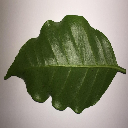

Y_TRAIN


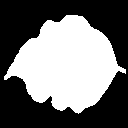

X_TEST


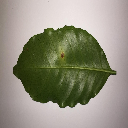

Y_TEST


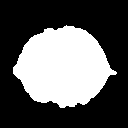

In [ ]:
# testing if the test and training folders work
print("X_TRIAN")
cv2_imshow(X_train[0])

print("Y_TRAIN")
cv2_imshow(Y_train[0]*255)

print("X_TEST")
cv2_imshow(X_test[0])

print("Y_TEST")
cv2_imshow(Y_test[0]*255)

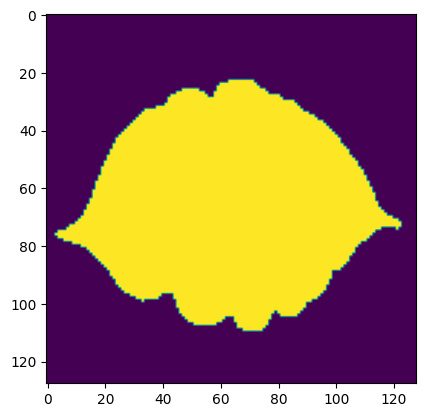

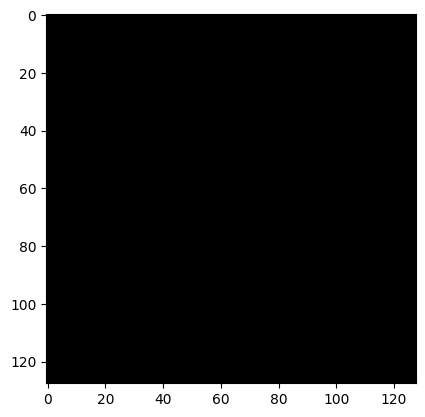

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(Y_train[20].astype(int))
plt.show()
plt.imshow(X_train[20].astype(int))
plt.show()

#MODEL BUILDING AND SEGMENTATION STEP

In [ ]:
# def UNet():
#Build the model
inputs = tf.keras.layers.Input((IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))
# s = tf.keras.layers.Lambda(lambda x: (x * 255).astype(int))(inputs)

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

outputs = tf.keras.layers.Conv2D(1, 1, activation='sigmoid')(c9)

model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()
# UNet()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_57 (Conv2D)             (None, 128, 128, 16  448         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_27 (Dropout)           (None, 128, 128, 16  0           ['conv2d_57[0][0]']              
                                )                                                           

In [ ]:
#  model checkpoint
import numpy as np
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose =1, save_best_only = True)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience =2, monitor =  "accuracy"),
    tf.keras.callbacks.TensorBoard(log_dir = 'logs')
]

Y_train = Y_train.reshape(400, 128,128)
results = model.fit(X_train, Y_train, validation_split = 0.1, batch_size = 16, epochs = 50, callbacks = callbacks)

Epoch 1/50
23/23 [==============================] - 77s 3s/step - loss: 0.3458 - accuracy: 0.8779 - val_loss: 0.4019 - val_accuracy: 0.9519
Epoch 2/50
23/23 [==============================] - 73s 3s/step - loss: 0.3282 - accuracy: 0.8931 - val_loss: 0.2956 - val_accuracy: 0.9434
Epoch 3/50
23/23 [==============================] - 74s 3s/step - loss: 0.3303 - accuracy: 0.8849 - val_loss: 0.2903 - val_accuracy: 0.9404
Epoch 4/50
23/23 [==============================] - 75s 3s/step - loss: 0.3038 - accuracy: 0.9077 - val_loss: 0.2752 - val_accuracy: 0.9524
Epoch 5/50
23/23 [==============================] - 74s 3s/step - loss: 0.2877 - accuracy: 0.9134 - val_loss: 0.2898 - val_accuracy: 0.9555
Epoch 6/50
23/23 [==============================] - 74s 3s/step - loss: 0.2811 - accuracy: 0.9147 - val_loss: 0.3029 - val_accuracy: 0.9545
Epoch 7/50
23/23 [==============================] - 76s 3s/step - loss: 0.2615 - accuracy: 0.9272 - val_loss: 0.2653 - val_accuracy: 0.9554
Epoch 8/50
23/23 [==

In [ ]:
a = model.predict(X_test)

2/2 [==============================] - 2s 688ms/step


In [ ]:
X_test.max()

255.0

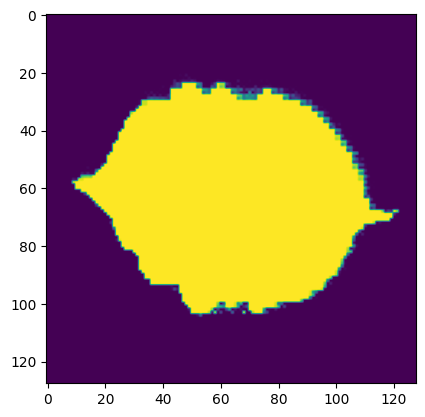

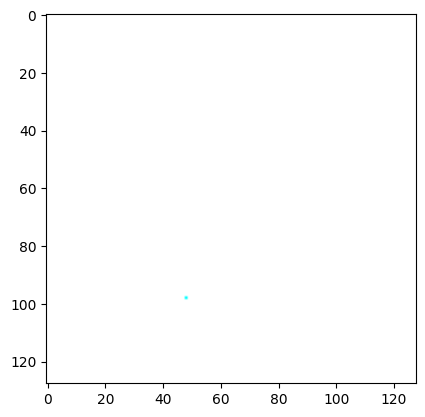

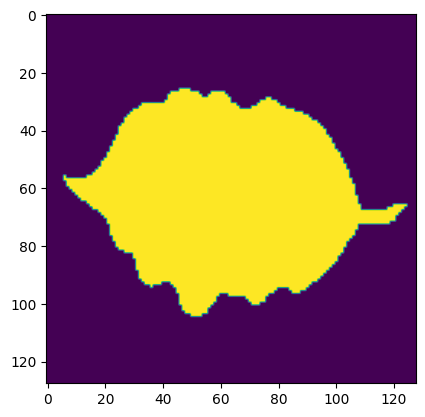

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(a[13]*255)
plt.show()
plt.imshow(X_test[13])
plt.show()
plt.imshow(Y_test[13])

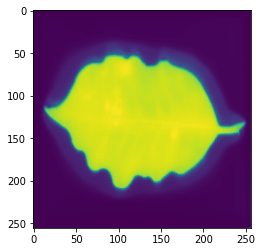

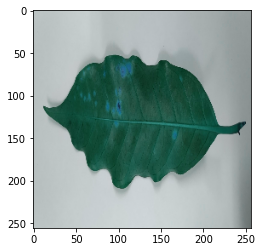

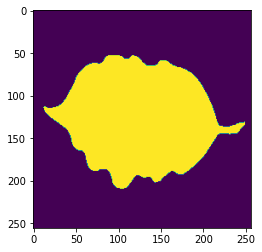

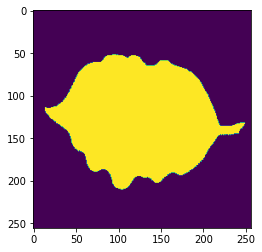

In [ ]:
import matplotlib.pyplot as plt
# plt.imshow(a[13])
# plt.show()
# plt.imshow(X_test[13])
# plt.show()
for i in range(15):
  plt.imshow(Y_test[i])
  plt.show()
  plt.imshow(imgs)

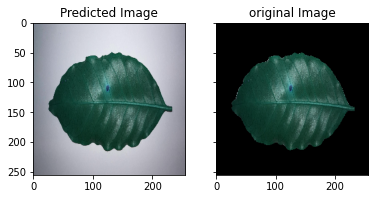

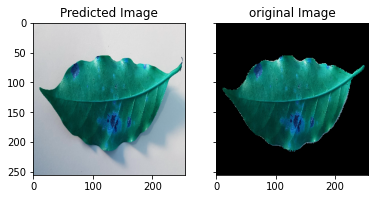

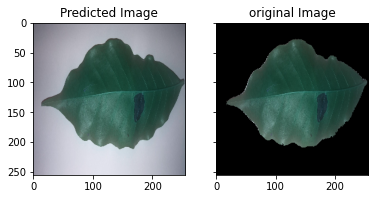

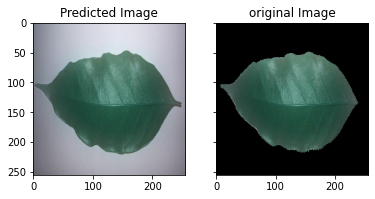

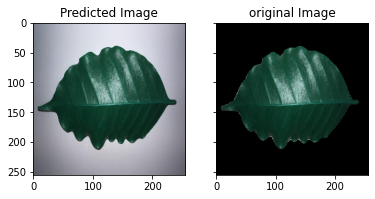

...

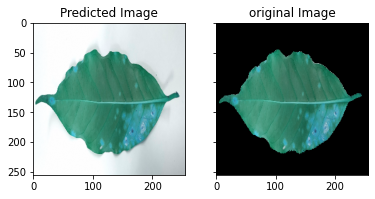

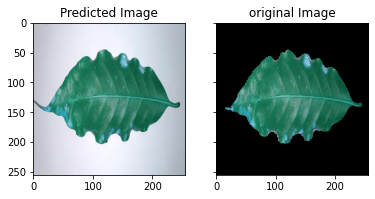

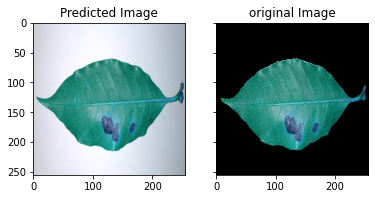

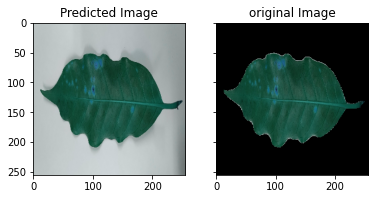

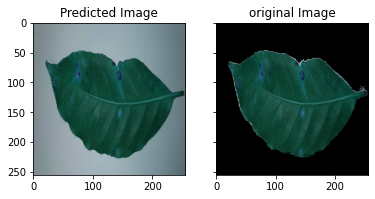

In [ ]:
# print()
import matplotlib.pyplot as plt
# import mathplotlib.
for i in range(15):
  p, imgs = cv.threshold(a[i]*255, 255//2, 255, cv.THRESH_BINARY)
  # # plt.imshow(Y_test[i])
  # # plt.show()
  # # plt.imshow(a[i])
  # # plt.show()
  # plt.subplot(211)
  # plt.imshow(imgs)
  # # plt.show()
  # plt.subplots
  # plt.imshow(Y_train[i])
  # plt.show()
  # imgs = cv.merge((imgs, imgs, imgs))
  # img2 = cv.bitwise_and(X_test[i], imgs)
  img2 = X_test[i].copy()
  img2[imgs == 0] = 0

  # Create two subplots and unpack the output array immediately
  f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
  ax1.imshow(X_test[i])
  ax1.set_title('Predicted Image')
  ax2.imshow(img2)
  ax2.set_title('original Image')

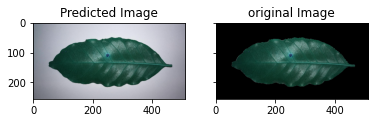

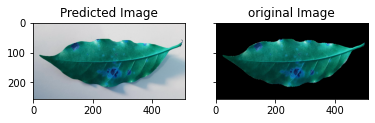

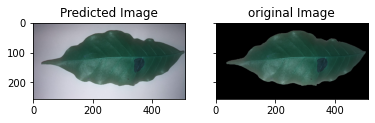

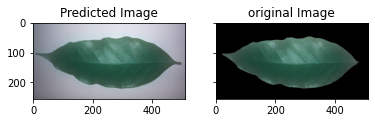

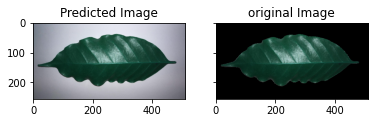

...

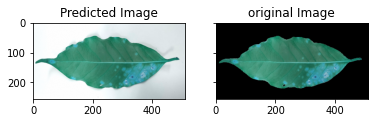

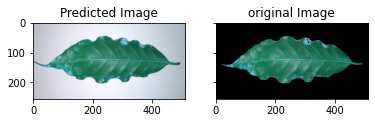

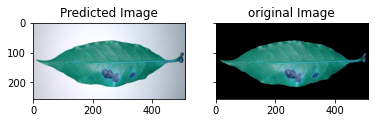

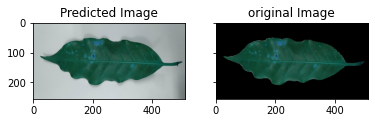

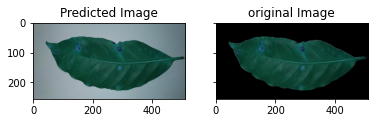

In [ ]:
# print()
import matplotlib.pyplot as plt
# import mathplotlib.
for i in range(15):
  p, imgs = cv.threshold(a[i]*255, 255//2, 255, cv.THRESH_BINARY)
  # # plt.imshow(Y_test[i])
  # # plt.show()
  # # plt.imshow(a[i])
  # # plt.show()
  # plt.subplot(211)
  # plt.imshow(imgs)
  # # plt.show()
  # plt.subplots
  # plt.imshow(Y_train[i])
  # plt.show()
  # imgs = cv.merge((imgs, imgs, imgs))
  # img2 = cv.bitwise_and(X_test[i], imgs)
  img2 = X_test[i].copy()
  img2[imgs == 0] = 0

  # Create two subplots and unpack the output array immediately
  f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
  ax1.imshow(X_test[i])
  ax1.set_title('Predicted Image')
  ax2.imshow(img2)
  ax2.set_title('original Image')

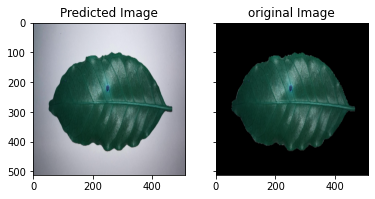

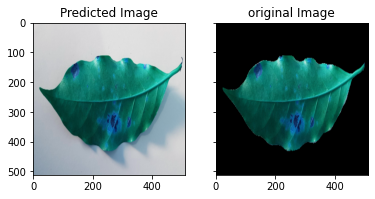

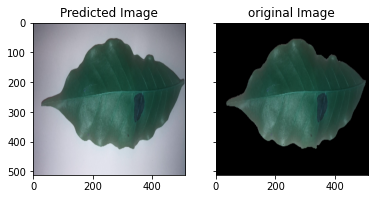

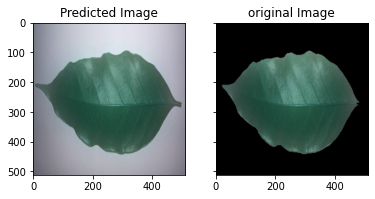

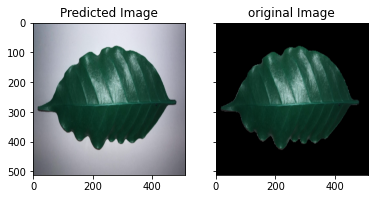

...

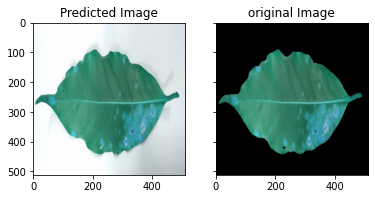

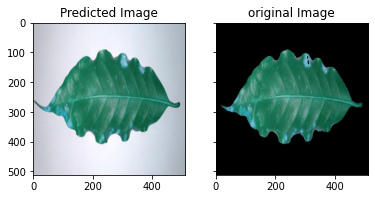

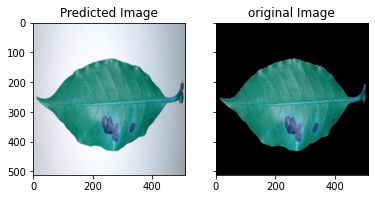

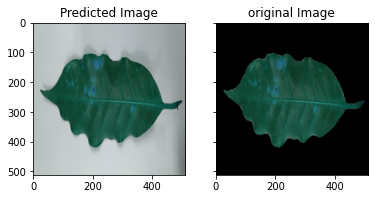

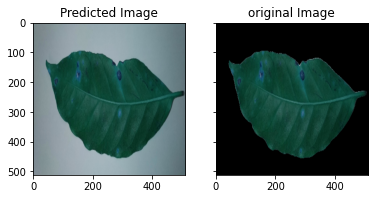

In [ ]:
# print()
import matplotlib.pyplot as plt
# import mathplotlib.
for i in range(15):
  p, imgs = cv.threshold(a[i]*255, 255//2, 255, cv.THRESH_BINARY)
  # # plt.imshow(Y_test[i])
  # # plt.show()
  # # plt.imshow(a[i])
  # # plt.show()
  # plt.subplot(211)
  # plt.imshow(imgs)
  # # plt.show()
  # plt.subplots
  # plt.imshow(Y_train[i])
  # plt.show()
  # imgs = cv.merge((imgs, imgs, imgs))
  # img2 = cv.bitwise_and(X_test[i], imgs)
  img2 = X_test[i].copy()
  img2[imgs == 0] = 0

  # Create two subplots and unpack the output array immediately
  f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
  ax1.imshow(cv.resize(X_test[i], (512, 512)))
  ax1.set_title('Predicted Image')
  ax2.imshow(cv.resize(img2, (512, 512)))
  ax2.set_title('original Image')

In [ ]:
model2.evaluate(X_test, Y_test)

2/2 [==============================] - 0s 91ms/step - loss: 0.0799 - accuracy: 0.9789


[0.07988372445106506, 0.9788549542427063]

In [ ]:
model.evaluate(X_test, Y_test)

2/2 [==============================] - 0s 116ms/step - loss: 0.0923 - accuracy: 0.9804


[0.0923117995262146, 0.9804425239562988]

In [ ]:
model2.evaluate(X_test, Y_test)

2/2 [==============================] - 0s 108ms/step - loss: 0.0810 - accuracy: 0.9812


[0.08102758228778839, 0.9811916947364807]

#Adding 2 depth to unet model

1.   List item

1.   List item
2.   List item


2.   List item



In [ ]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
# def UNet_plus_2(inputs):
#   global IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS
#Build the model
inputs = tf.keras.layers.Input((IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))
# s = tf.keras.layers.Lambda(lambda x: x * 255)(inputs)

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c5)
p5 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c5)

c6 = tf.keras.layers.Conv2D(512, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p5)
c6 = tf.keras.layers.Dropout(0.3)(c6)
c6 = tf.keras.layers.Conv2D(512, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c6)
p6 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c6)

c7 = tf.keras.layers.Conv2D(1024, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p6)
c7 = tf.keras.layers.Dropout(0.3)(c7)
c7 = tf.keras.layers.Conv2D(1024, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c7)


#Expansive path
u8 = tf.keras.layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c6])
c8 = tf.keras.layers.Conv2D(512, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.2)(c8)
c8 = tf.keras.layers.Conv2D(512, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c8)

u9 = tf.keras.layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c5])
c9 = tf.keras.layers.Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.2)(c9)
c9 = tf.keras.layers.Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c9)

u10 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c9)
u10 = tf.keras.layers.concatenate([u10, c4])
c10 = tf.keras.layers.Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u10)
c10 = tf.keras.layers.Dropout(0.2)(c10)
c10 = tf.keras.layers.Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c10)

u11 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c10)
u11 = tf.keras.layers.concatenate([u11, c3])
c11 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u11)
c11 = tf.keras.layers.Dropout(0.2)(c11)
c11 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c11)

u12 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c11)
u12 = tf.keras.layers.concatenate([u12, c2])
c12 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u12)
c12 = tf.keras.layers.Dropout(0.1)(c12)
c12 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c12)

u13 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c12)
u13 = tf.keras.layers.concatenate([u13, c1], axis=3)
c13 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u13)
c13 = tf.keras.layers.Dropout(0.1)(c13)
c13 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c13)

# def custom_activation(x):
#     threshold = 100
#     cond = tf.keras.backend.greater(x, threshold)
#     out = tf.keras.backend.cast(cond, tf.keras.backend.floatx())
#     return out

# def custom_activation(x):
#     threshold = 100
#     print(tf.zeros_like(x))
#     out = tf.where(tf.greater(x, threshold), x, tf.zeros_like(x))
#     return out

# @tf.custom_gradient
# def custom_activation_grad(x):
#     y = custom_activation(x)

#     def grad(dy):
#         threshold = 100
#         cond = tf.greater(x, threshold)
#         dx = tf.where(cond, tf.ones_like(x), tf.zeros_like(x))
#         return dy * dx

#     return y, grad

outputs = tf.keras.layers.Conv2D(1, 1, activation="sigmoid")(c13)
# outputs = tf.keras.layers.Conv2D(1, 1, activation=custom_activation)(c13)
# outputs = tf.keras.layers.Conv2D(1, (1, 1), activation=custom_activation)(c13)
# outputs = tf.keras.layers.Conv2D(1, (1, 1), activation="selu")(outputs)

model2 = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# model2.summary()
# UNet()

In [ ]:
# model3 = cv.threshold(model2 * 255, 100, 255, cv.THRESH_BINARY)[1]

In [ ]:
#  model checkpoint
import numpy as np
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose =1, save_best_only = True)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience =4, monitor =  "val_accuracy"),
    tf.keras.callbacks.TensorBoard(log_dir = 'logs')
]
results2 = model2.fit(X_train, Y_train, validation_split = 0.1, batch_size = 16, epochs = 50, callbacks = callbacks)

Epoch 1/50
23/23 [==============================] - 13s 114ms/step - loss: 0.3903 - accuracy: 0.8777 - val_loss: 0.1821 - val_accuracy: 0.9546
Epoch 2/50
23/23 [==============================] - 2s 91ms/step - loss: 0.2307 - accuracy: 0.9376 - val_loss: 0.1698 - val_accuracy: 0.9556
Epoch 3/50
23/23 [==============================] - 2s 91ms/step - loss: 0.2027 - accuracy: 0.9396 - val_loss: 0.1440 - val_accuracy: 0.9565
Epoch 4/50
23/23 [==============================] - 2s 92ms/step - loss: 0.1885 - accuracy: 0.9414 - val_loss: 0.1554 - val_accuracy: 0.9561
Epoch 5/50
23/23 [==============================] - 2s 92ms/step - loss: 0.1789 - accuracy: 0.9419 - val_loss: 0.1302 - val_accuracy: 0.9576
Epoch 6/50
23/23 [==============================] - 2s 98ms/step - loss: 0.1727 - accuracy: 0.9428 - val_loss: 0.1320 - val_accuracy: 0.9562
Epoch 7/50
23/23 [==============================] - 2s 93ms/step - loss: 0.1689 - accuracy: 0.9423 - val_loss: 0.1254 - val_accuracy: 0.9579
Epoch 8/50


In [ ]:
#  model checkpoint
import numpy as np
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose =1, save_best_only = True)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience =4, monitor =  "val_accuracy"),
    tf.keras.callbacks.TensorBoard(log_dir = 'logs')
]
results2 = model2.fit(X_train, Y_train, validation_split = 0.1, batch_size = 16, epochs = 50, callbacks = callbacks)

Epoch 1/50
23/23 [==============================] - 19s 307ms/step - loss: 0.4852 - accuracy: 0.7228 - val_loss: 0.1834 - val_accuracy: 0.9571
Epoch 2/50
23/23 [==============================] - 5s 229ms/step - loss: 0.2228 - accuracy: 0.9444 - val_loss: 0.1682 - val_accuracy: 0.9568
Epoch 3/50
23/23 [==============================] - 5s 231ms/step - loss: 0.2128 - accuracy: 0.9453 - val_loss: 0.1666 - val_accuracy: 0.9585
Epoch 4/50
23/23 [==============================] - 5s 229ms/step - loss: 0.2044 - accuracy: 0.9456 - val_loss: 0.1616 - val_accuracy: 0.9580
Epoch 5/50
23/23 [==============================] - 5s 233ms/step - loss: 0.1997 - accuracy: 0.9462 - val_loss: 0.1485 - val_accuracy: 0.9591
Epoch 6/50
23/23 [==============================] - 5s 233ms/step - loss: 0.1921 - accuracy: 0.9439 - val_loss: 0.1554 - val_accuracy: 0.9577
Epoch 7/50
23/23 [==============================] - 5s 233ms/step - loss: 0.1930 - accuracy: 0.9461 - val_loss: 0.1510 - val_accuracy: 0.9597
Epoch

#Multi-Class Classification using UNET

In [ ]:
import os
import glob
import io
from tqdm import tqdm
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import tensorflow as tf

In [ ]:
!git clone https://github.com/esgario/lara2018.git

Cloning into 'lara2018'...
remote: Enumerating objects: 5950, done.
remote: Total 5950 (delta 0), reused 0 (delta 0), pack-reused 5950
Receiving objects: 100% (5950/5950), 116.88 MiB | 33.67 MiB/s, done.
Resolving deltas: 100% (451/451), done.
Updating files: 100% (5559/5559), done.


In [ ]:
IMG_WIDTH = 512
IMG_HEIGHT = 512
IMG_CHANNELS = 3

Y_train_data_path = "/content/lara2018/segmentation/dataset/annotations/train"
Y_test_data_path = "/content/lara2018/segmentation/dataset/annotations/test"
X_train_data_path = "/content/lara2018/segmentation/dataset/images/train"
X_test_data_path = "/content/lara2018/segmentation/dataset/images/test"

VOC_COLORMAP = [ [0, 0, 0],[  0,   0, 255], [  0, 176,   0] ]
# [0. 0. 0.], [0. 0. 1.], [0.         0.69019608 0.        ]

VOC_CLASSES = [
        'background', 'Healthy', 'Disease_Area',
    ]

In [ ]:
import cv2 as cv
def make_dir(path):
  if not os.path.exists(path):
    os.mkdir(path)

def process_mask(rgb_mask, colormap):
    output_mask = []
    for i, color in enumerate(colormap):
        cmap = np.all(np.equal(rgb_mask, color), axis=-1)
        output_mask.append(cmap)

    output_mask = np.stack(output_mask, axis=-1)
    return output_mask

make_dir("multiclass")

def create_train_test_image_folders(path, file_extension, folder_name, is_mask = False):
  global VOC_CLASSES, VOC_COLORMAP, IMG_CHANNELS, IMG_HEIGHT, IMG_WIDTH
  print("running for", folder_name)

  make_dir(os.path.join(os.getcwd(), "multiclass", folder_name))
  path_list = sorted(glob.glob(path+"/*." + file_extension))
  images_list = []
  for path in tqdm(path_list, total= len(path_list)):
    img = cv.imread(path)[:,:,:IMG_CHANNELS]
    img = cv.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    if(is_mask):
      img = process_mask(img, VOC_COLORMAP)
      """ Converting one-hot mask to single channel mask """
      grayscale_mask = np.argmax(img, axis=-1)
      grayscale_mask = (grayscale_mask / len(VOC_CLASSES)) * 255
      grayscale_mask = np.expand_dims(grayscale_mask, axis=-1)
      # img = grayscale_mask

    image_name = path.split("/")[-1]
    img = img/ 1
    images_list.append(img)
    save_path = os.path.join(os.getcwd(), "multiclass", folder_name, image_name)
    if is_mask: cv.imwrite(save_path, grayscale_mask)
    else: cv.imwrite(save_path, img)
  return images_list

In [ ]:
Y_train = np.array(create_train_test_image_folders(Y_train_data_path, 'png', "Y_train", is_mask = True))
X_train = np.array(create_train_test_image_folders(X_train_data_path, 'jpg', "X_train"))
# Y_test = np.array(create_train_test_image_folders(Y_test_data_path, 'png', "Y_test", is_mask = True))
# X_test = np.array(create_train_test_image_folders(X_test_data_path,  'jpg', "X_test"))

running for Y_train


100%|██████████| 400/400 [00:23<00:00, 17.16it/s]


running for X_train


100%|██████████| 400/400 [00:13<00:00, 29.11it/s]


(512, 512, 1)


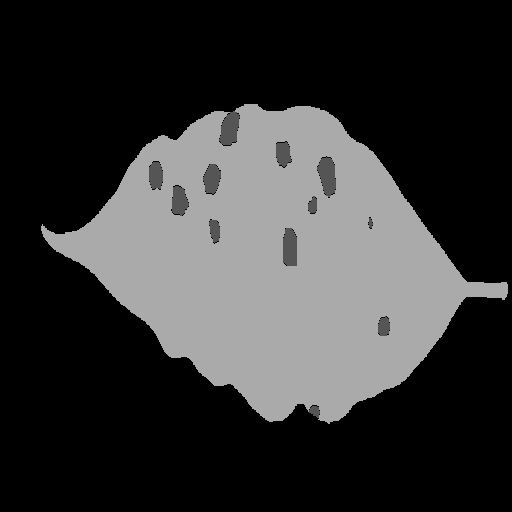

In [ ]:
grayscale_mask = np.argmax(Y_train[10], axis=-1)
grayscale_mask = (grayscale_mask *255/ len(VOC_CLASSES))
grayscale_mask = np.expand_dims(grayscale_mask, axis=-1)
print(grayscale_mask.shape)
cv2_imshow(grayscale_mask)

In [ ]:
print(Y_train[0]/1)

[[[1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]]

 [[1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]]

 [[1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]]

 ...

 [[1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]]

 [[1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]]

 [[1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [1. 0. 0.]]]


In [ ]:
cv

In [ ]:
def multi_class_UNet(classes, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS):
  #   global IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS
  #Build the model
  inputs = tf.keras.layers.Input((IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))
  # s = tf.keras.layers.Lambda(lambda x: x * 255)(inputs)

  #Contraction path
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
  c1 = tf.keras.layers.Dropout(0.1)(c1)
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
  p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  c2 = tf.keras.layers.Dropout(0.1)(c2)
  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
  p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  c3 = tf.keras.layers.Dropout(0.2)(c3)
  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
  p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  c4 = tf.keras.layers.Dropout(0.2)(c4)
  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
  p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  c5 = tf.keras.layers.Dropout(0.3)(c5)
  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
  p5 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c5)

  c6 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p5)
  c6 = tf.keras.layers.Dropout(0.3)(c6)
  c6 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
  p6 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c6)

  c7 = tf.keras.layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p6)
  c7 = tf.keras.layers.Dropout(0.3)(c7)
  c7 = tf.keras.layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)


  #Expansive path
  u8 = tf.keras.layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = tf.keras.layers.concatenate([u8, c6])
  c8 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
  c8 = tf.keras.layers.Dropout(0.2)(c8)
  c8 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

  u9 = tf.keras.layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = tf.keras.layers.concatenate([u9, c5])
  c9 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
  c9 = tf.keras.layers.Dropout(0.2)(c9)
  c9 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

  u10 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c9)
  u10 = tf.keras.layers.concatenate([u10, c4])
  c10 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u10)
  c10 = tf.keras.layers.Dropout(0.2)(c10)
  c10 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c10)

  u11 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c10)
  u11 = tf.keras.layers.concatenate([u11, c3])
  c11 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u11)
  c11 = tf.keras.layers.Dropout(0.2)(c11)
  c11 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c11)

  u12 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c11)
  u12 = tf.keras.layers.concatenate([u12, c2])
  c12 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u12)
  c12 = tf.keras.layers.Dropout(0.1)(c12)
  c12 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c12)

  u13 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c12)
  u13 = tf.keras.layers.concatenate([u13, c1], axis=3)
  c13 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u13)
  c13 = tf.keras.layers.Dropout(0.1)(c13)
  c13 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c13)

  outputs = tf.keras.layers.Conv2D(classes, 1, activation="softmax")(c13)

  Unet_MultiClass_model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  # Unet_MultiClass_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  return Unet_MultiClass_model


In [ ]:
#  model checkpoint
model = multi_class_UNet(3, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_nuclei.h5', verbose =1, save_best_only = True)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience =4, monitor =  "val_accuracy"),
    tf.keras.callbacks.TensorBoard(log_dir = 'logs')
]
results2 = model.fit(X_train, Y_train, validation_split = 0.1, batch_size = 16, epochs = 50, callbacks = callbacks)

Epoch 1/50
23/23 [==============================] - 60s 1s/step - loss: 6.9206 - accuracy: 0.7459 - val_loss: 0.6114 - val_accuracy: 0.8666
Epoch 2/50
23/23 [==============================] - 20s 860ms/step - loss: 0.6941 - accuracy: 0.8645 - val_loss: 0.2971 - val_accuracy: 0.9211
Epoch 3/50
23/23 [==============================] - 20s 849ms/step - loss: 0.4331 - accuracy: 0.8963 - val_loss: 0.3333 - val_accuracy: 0.9332
Epoch 4/50
23/23 [==============================] - 19s 835ms/step - loss: 0.3740 - accuracy: 0.9088 - val_loss: 0.3079 - val_accuracy: 0.9375
Epoch 5/50
23/23 [==============================] - 19s 848ms/step - loss: 0.3422 - accuracy: 0.9173 - val_loss: 0.2613 - val_accuracy: 0.9398
Epoch 6/50
23/23 [==============================] - 20s 850ms/step - loss: 0.3228 - accuracy: 0.9237 - val_loss: 0.3457 - val_accuracy: 0.9374
Epoch 7/50
23/23 [==============================] - 19s 844ms/step - loss: 0.3049 - accuracy: 0.9271 - val_loss: 0.4987 - val_accuracy: 0.8799
Ep

In [ ]:
y = model.predict(np.array(X_train[0:40]))
print(y)

2/2 [==============================] - 1s 10ms/step
[[[[8.86137486e-01 1.08262650e-12 1.13862470e-01]
   [7.98540473e-01 9.83621717e-09 2.01459512e-01]
   [8.02836657e-01 1.07097733e-11 1.97163373e-01]
   ...
   [9.66423392e-01 2.12350018e-17 3.35766301e-02]
   [9.35521007e-01 1.42865954e-17 6.44790232e-02]
   [9.88568664e-01 1.74197381e-13 1.14314007e-02]]

  [[8.14059019e-01 8.52433749e-12 1.85940996e-01]
   [8.60086679e-01 3.21989649e-17 1.39913261e-01]
   [9.05509651e-01 3.11788551e-22 9.44903493e-02]
   ...
   [9.99931693e-01 0.00000000e+00 6.83158214e-05]
   [9.99813497e-01 0.00000000e+00 1.86548670e-04]
   [9.99445975e-01 3.20981859e-27 5.54017082e-04]]

  [[8.79596114e-01 9.37962066e-17 1.20403856e-01]
   [8.87222588e-01 1.31937998e-20 1.12777367e-01]
   [9.57556188e-01 2.64239665e-29 4.24437299e-02]
   ...
   [9.99957323e-01 0.00000000e+00 4.26715487e-05]
   [9.99712288e-01 0.00000000e+00 2.87632924e-04]
   [9.99703467e-01 2.44058841e-31 2.96534417e-04]]

  ...

  [[9.47525799

(512, 512, 1)


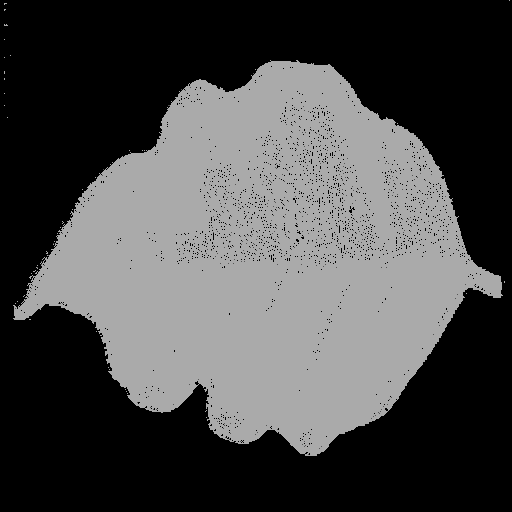

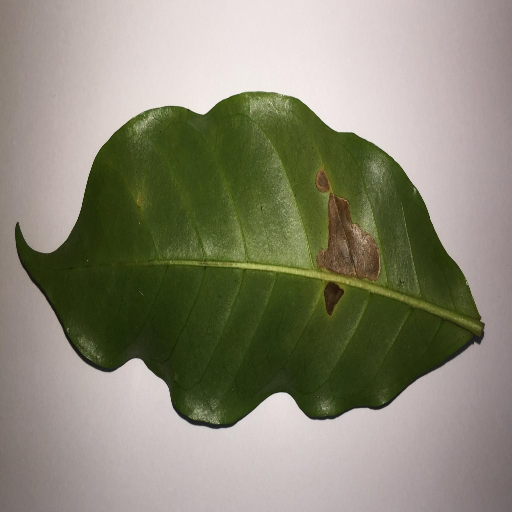

(512, 512, 1)


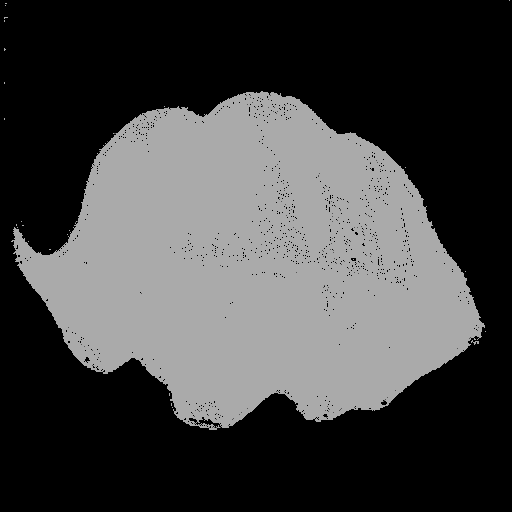

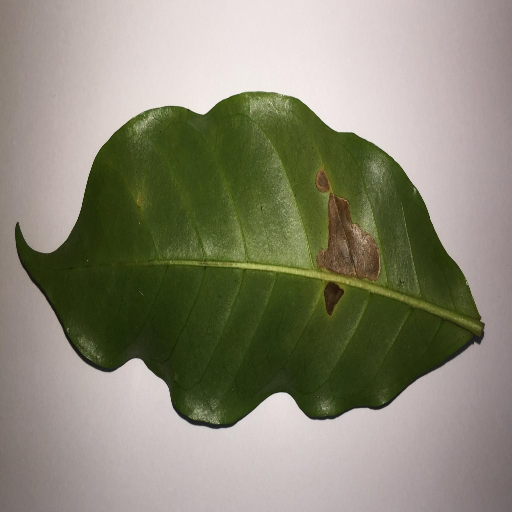

(512, 512, 1)


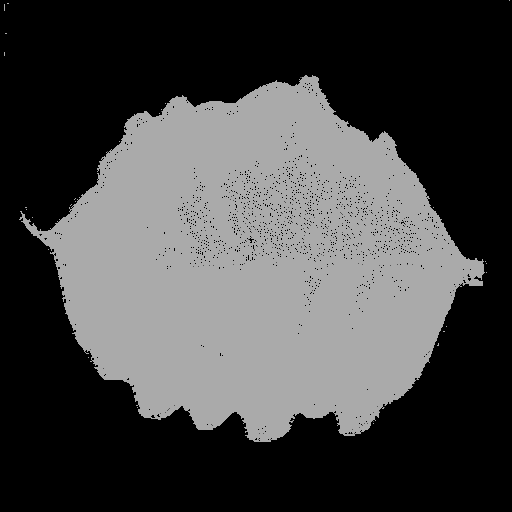

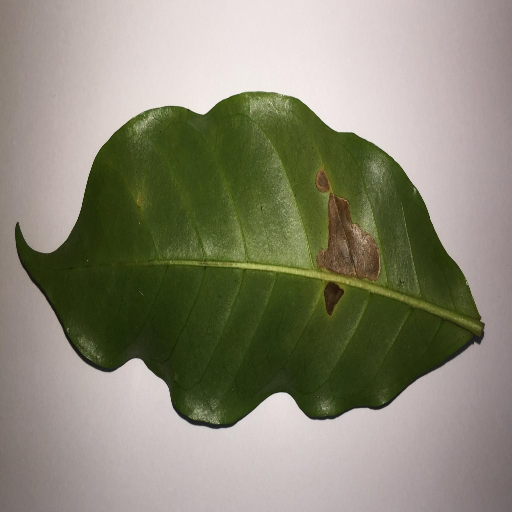

(512, 512, 1)


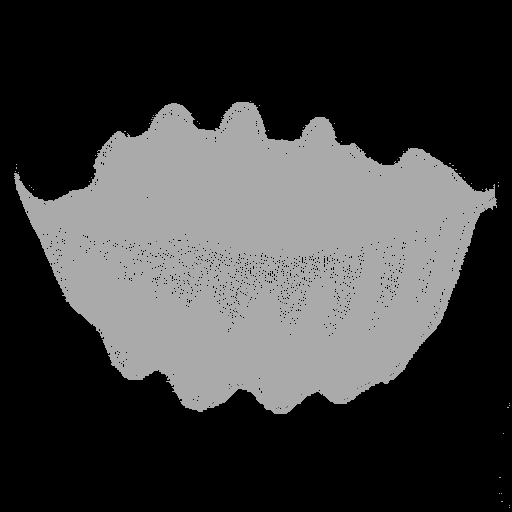

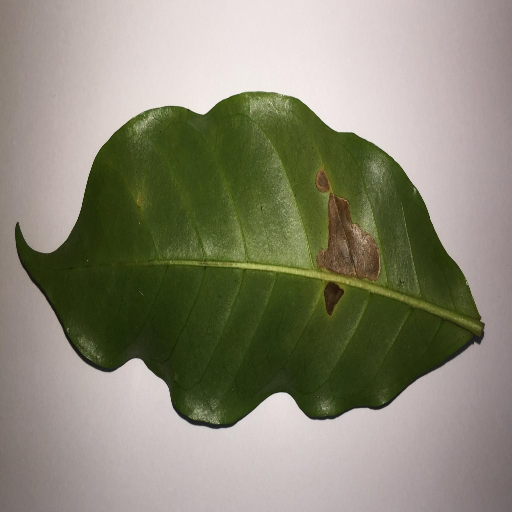

(512, 512, 1)


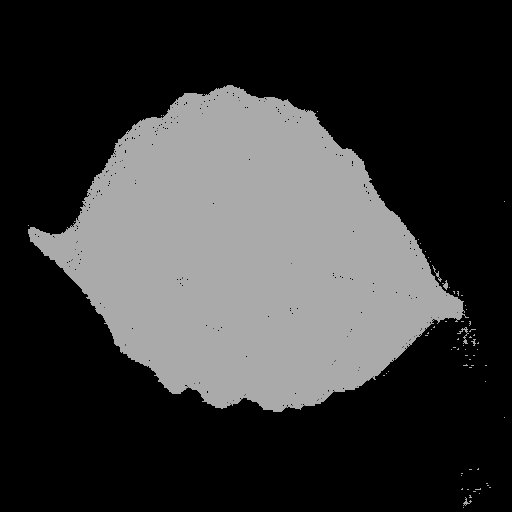

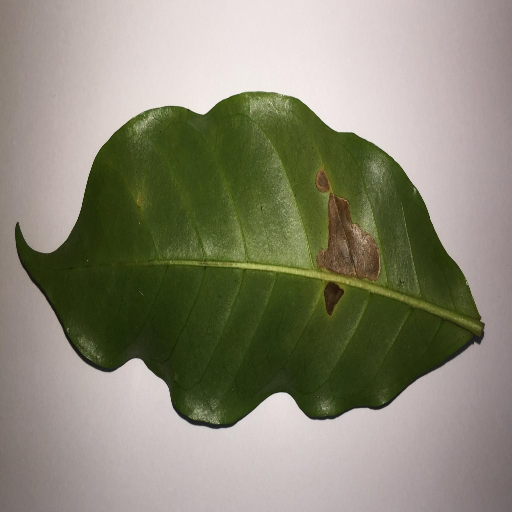

(512, 512, 1)


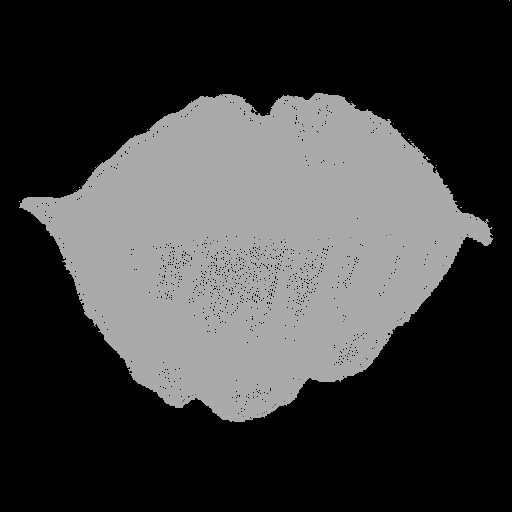

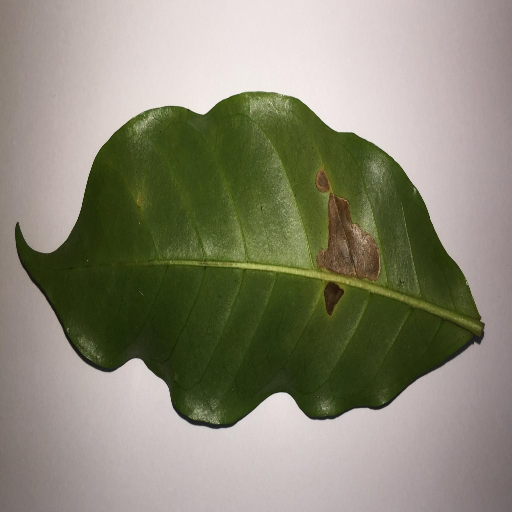

(512, 512, 1)


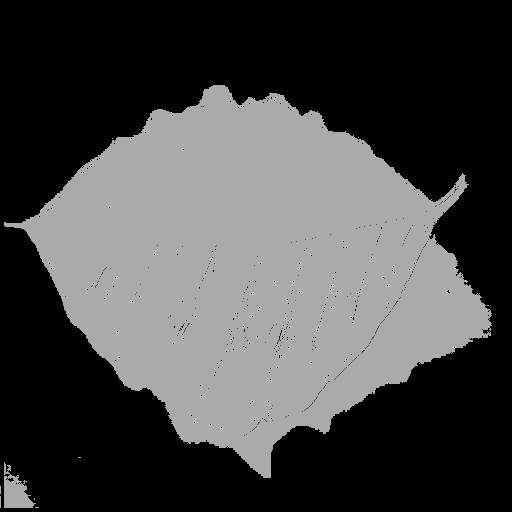

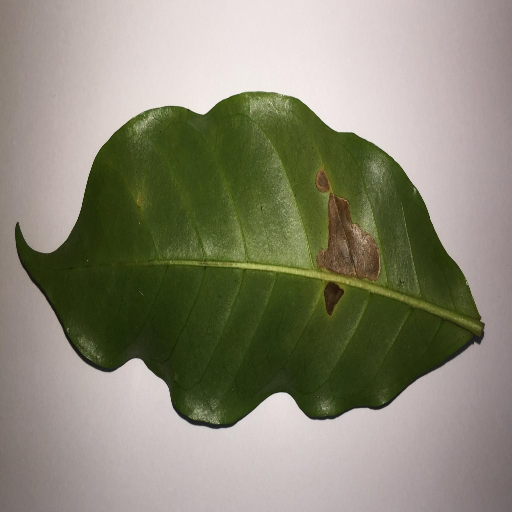

(512, 512, 1)


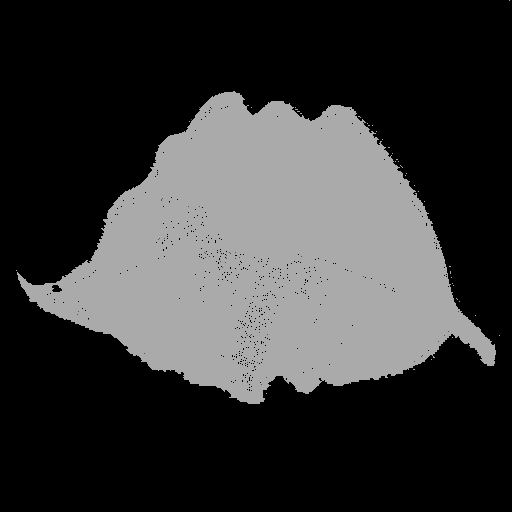

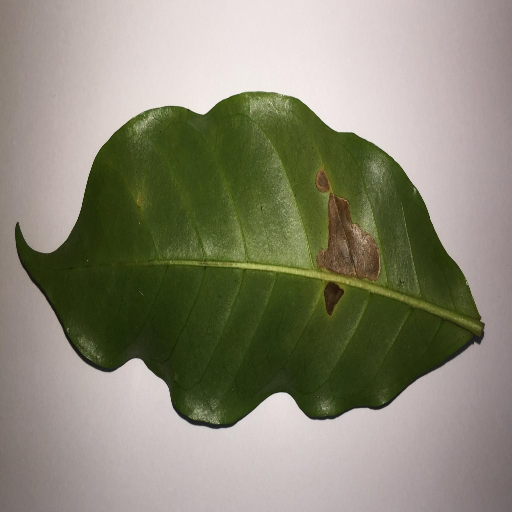

(512, 512, 1)


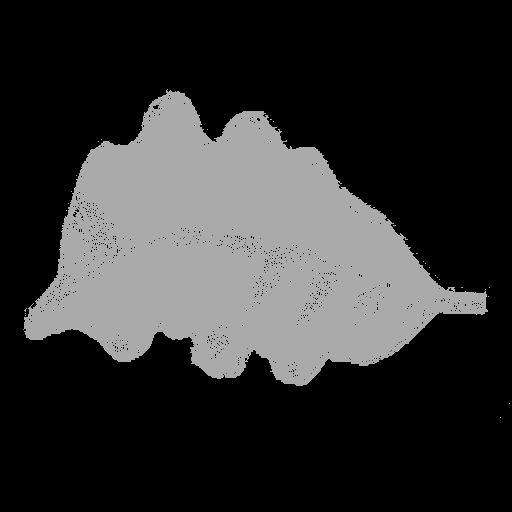

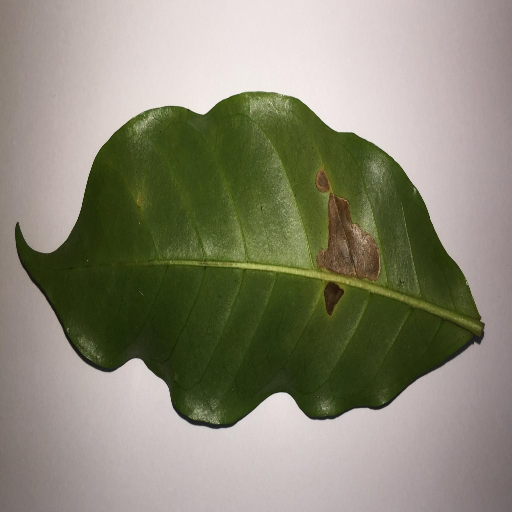

(512, 512, 1)


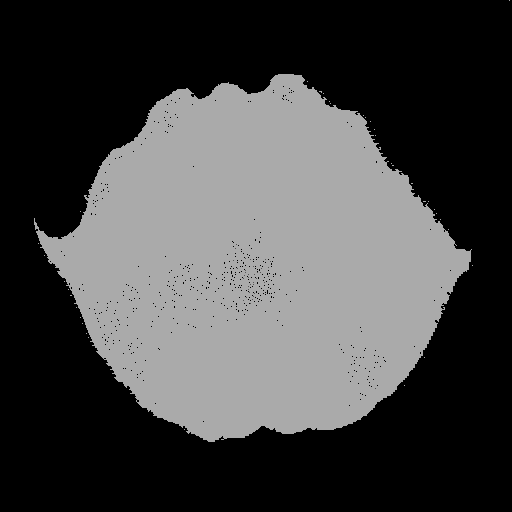

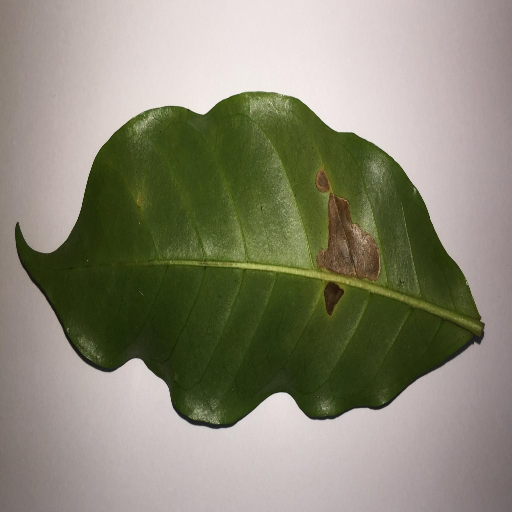

(512, 512, 1)


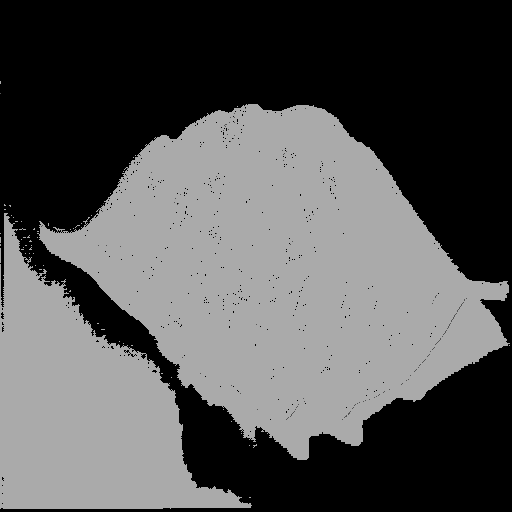

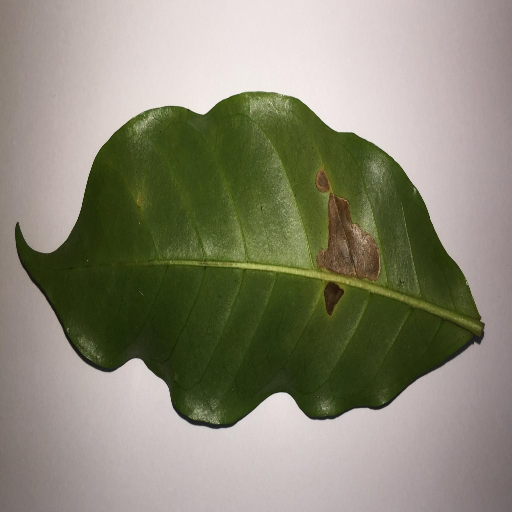

(512, 512, 1)


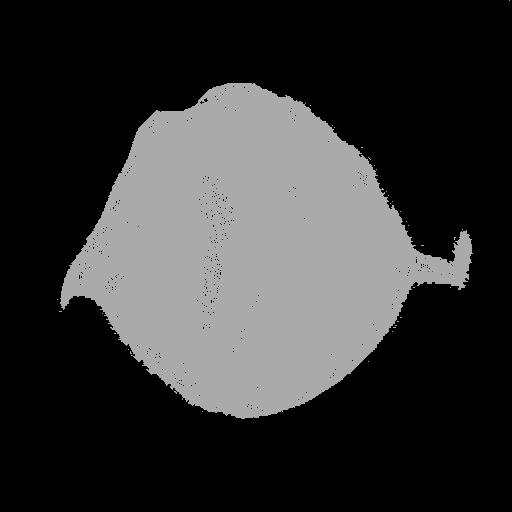

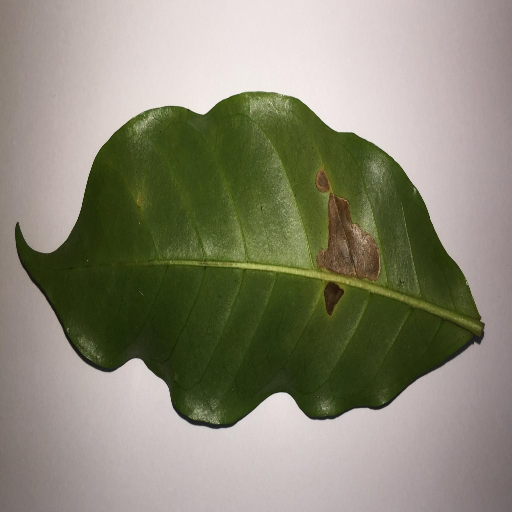

(512, 512, 1)


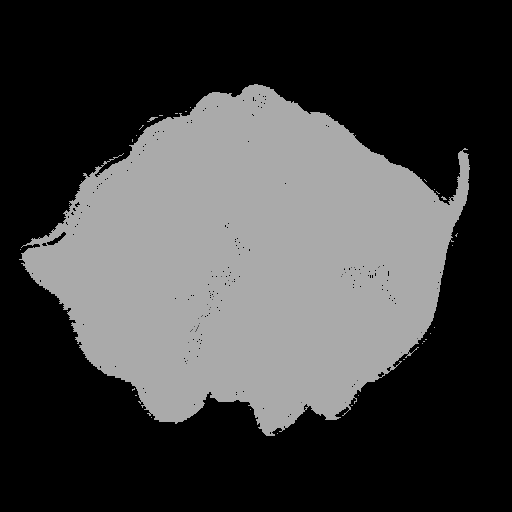

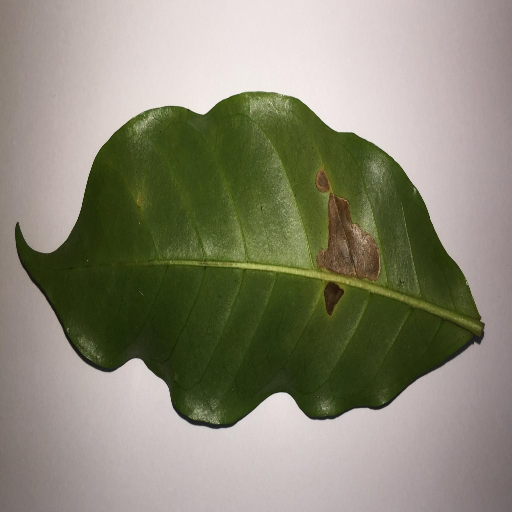

(512, 512, 1)


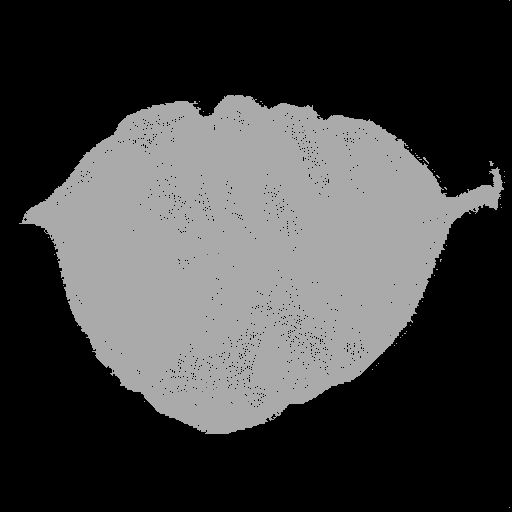

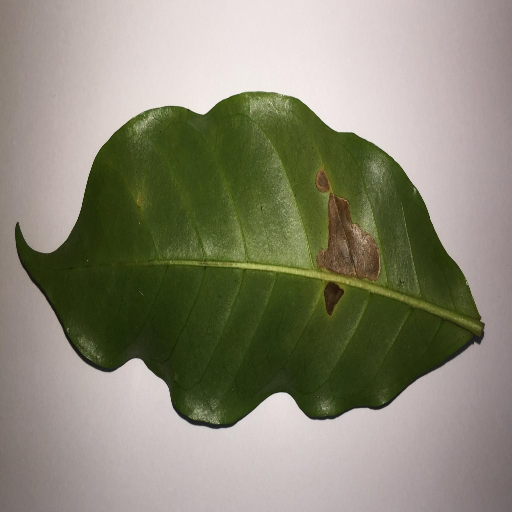

(512, 512, 1)


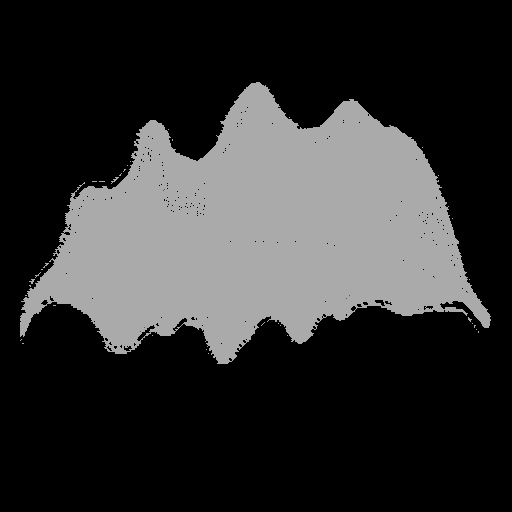

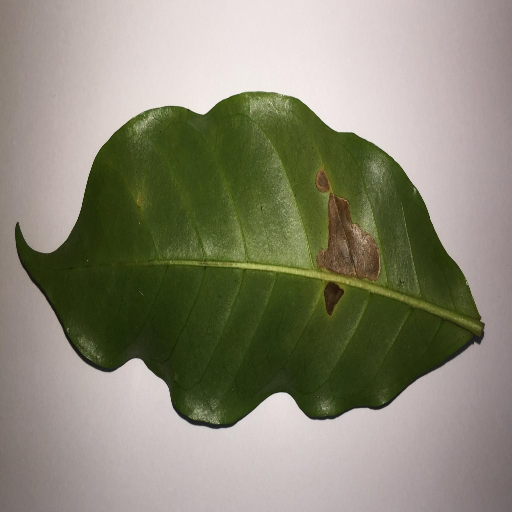

(512, 512, 1)


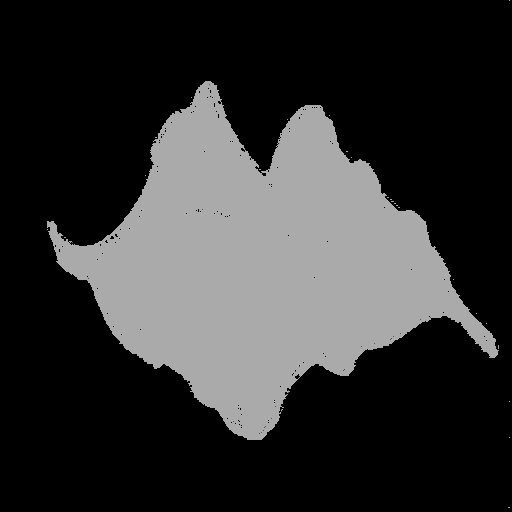

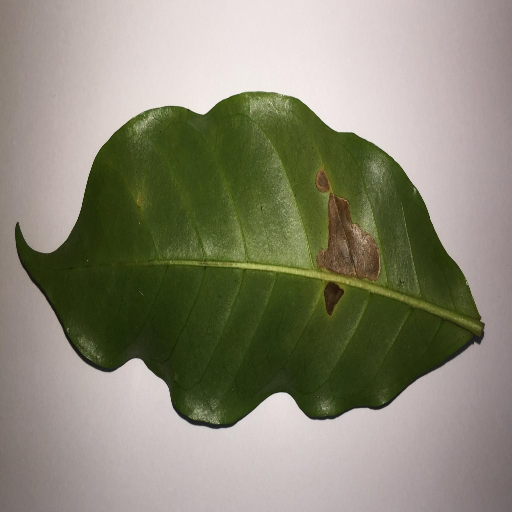

(512, 512, 1)


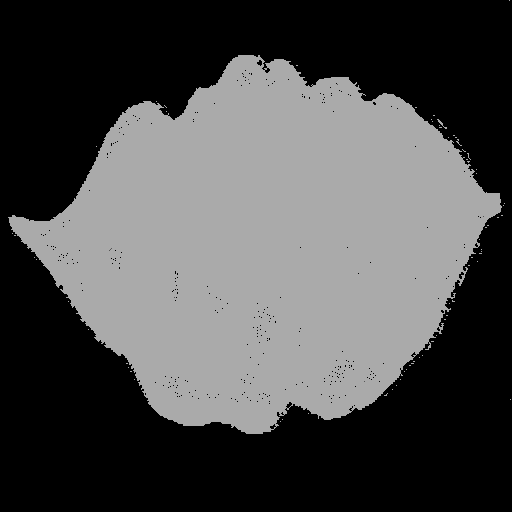

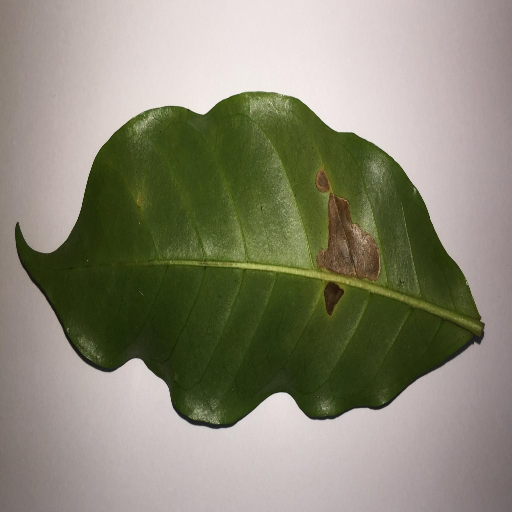

(512, 512, 1)


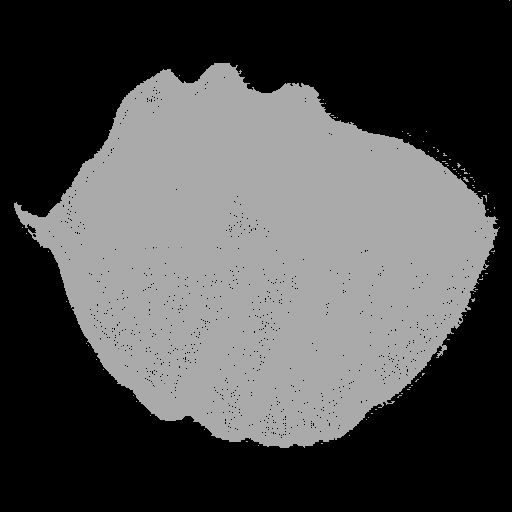

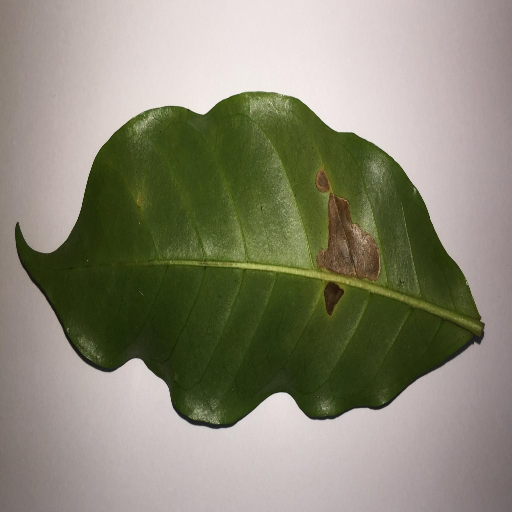

(512, 512, 1)


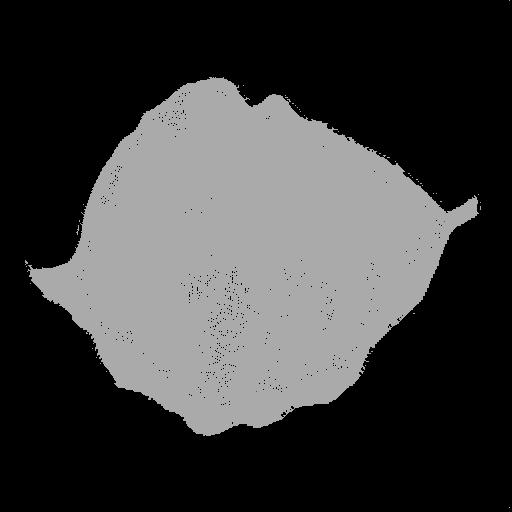

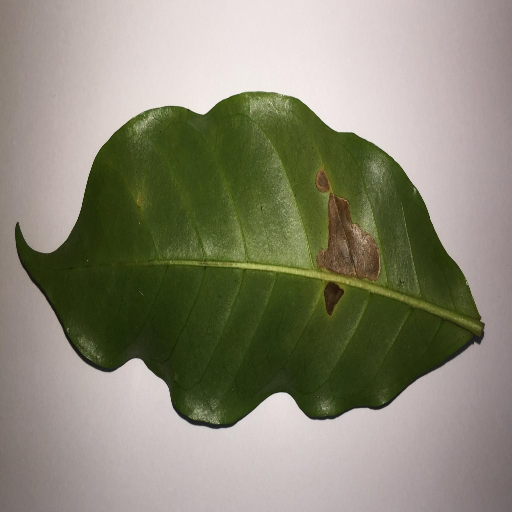

(512, 512, 1)


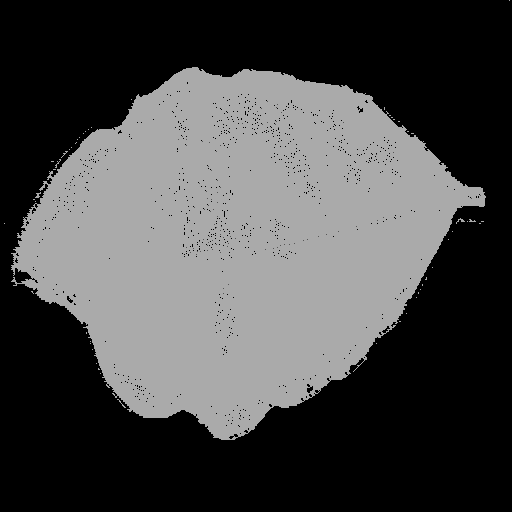

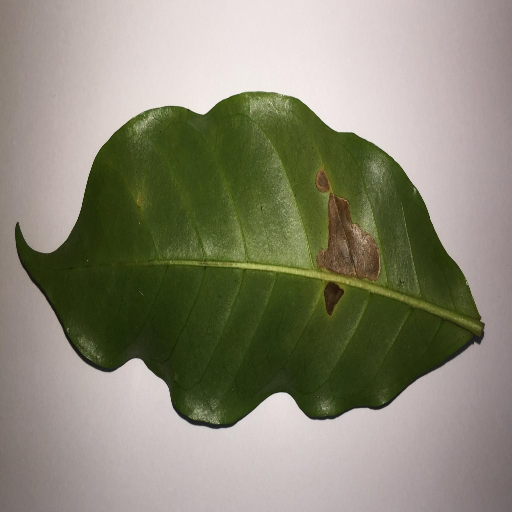

(512, 512, 1)


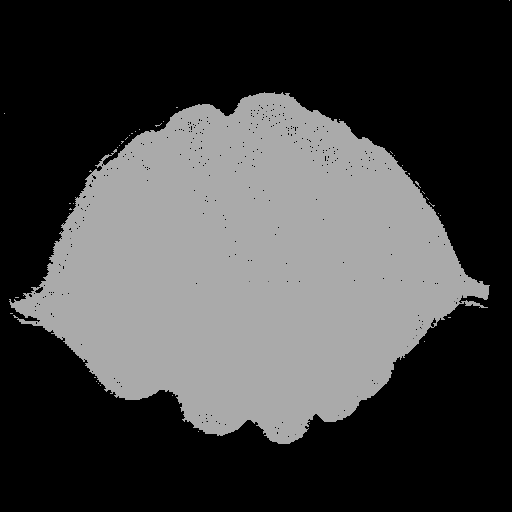

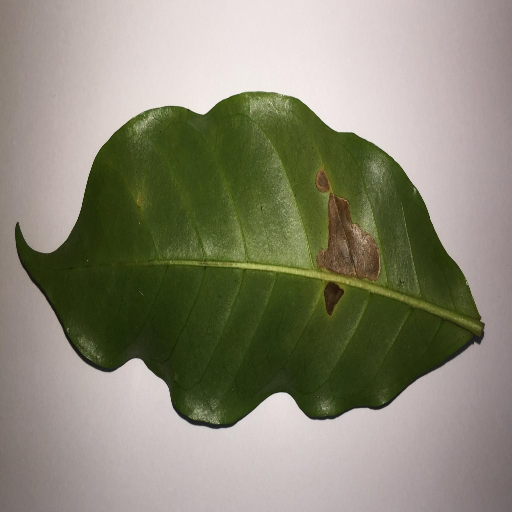

(512, 512, 1)


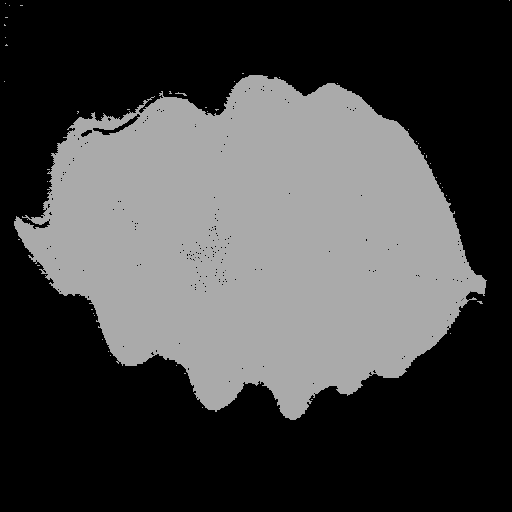

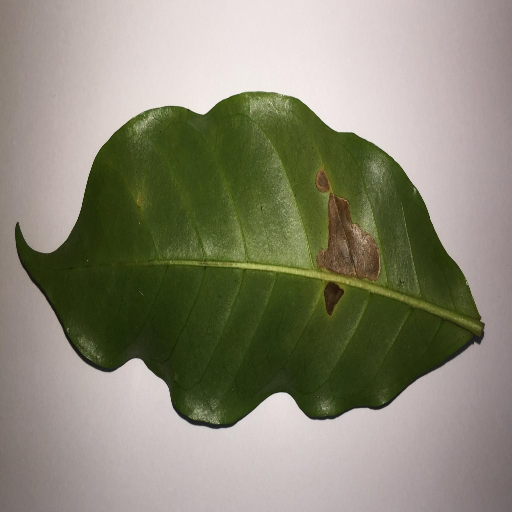

(512, 512, 1)


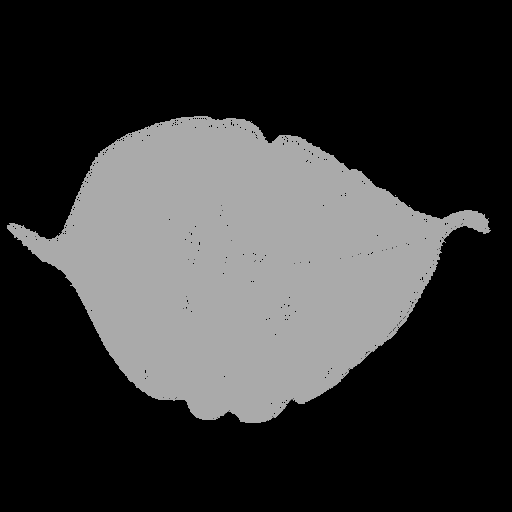

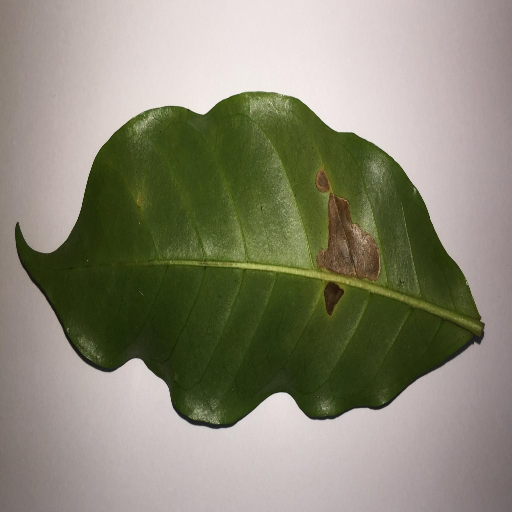

(512, 512, 1)


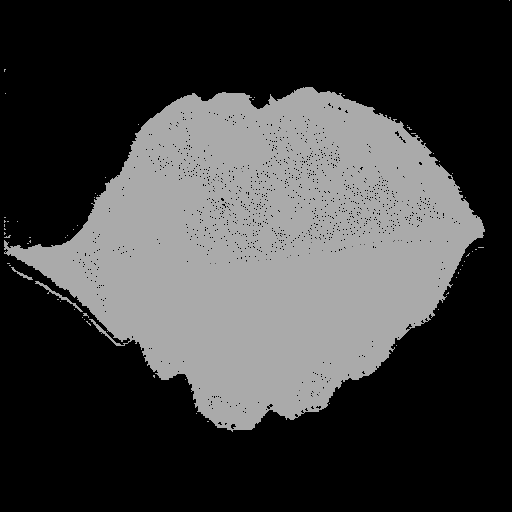

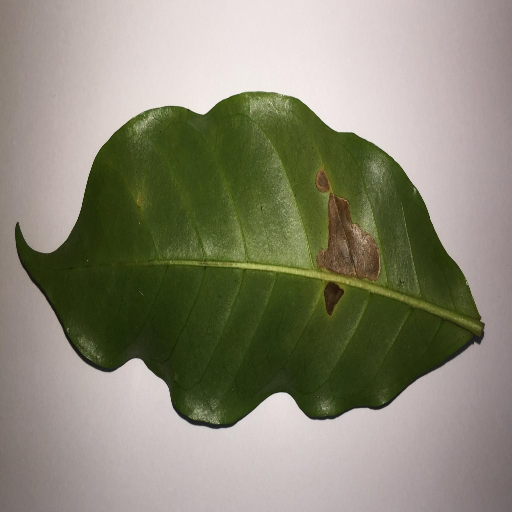

(512, 512, 1)


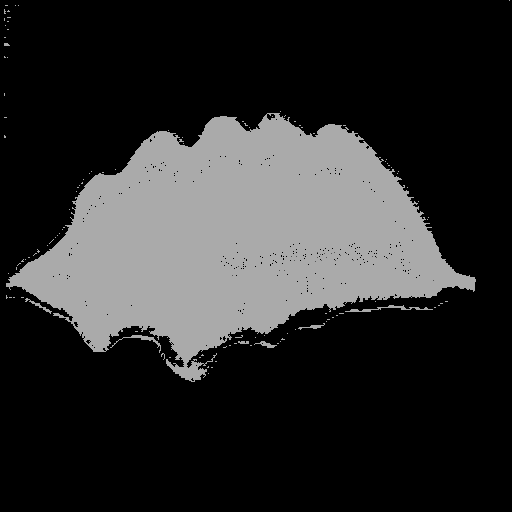

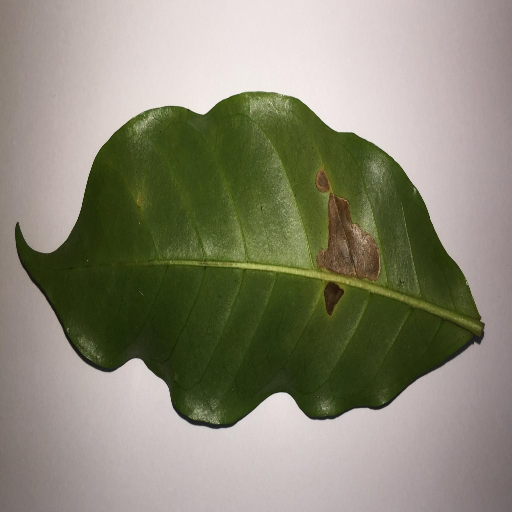

(512, 512, 1)


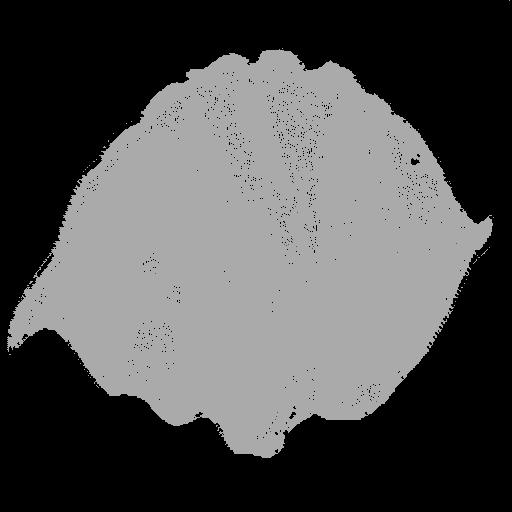

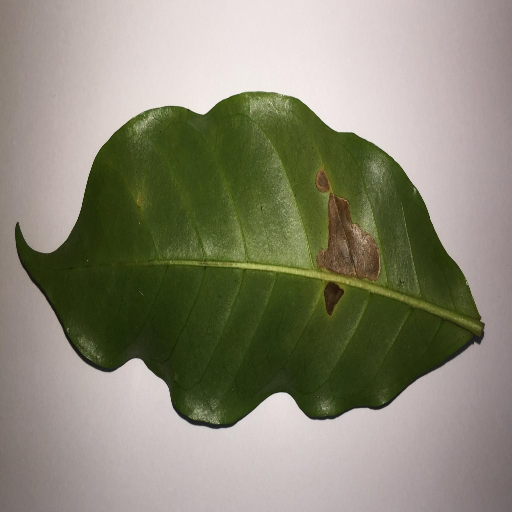

(512, 512, 1)


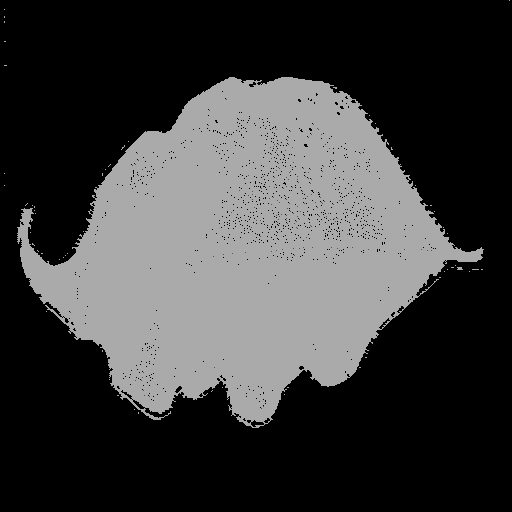

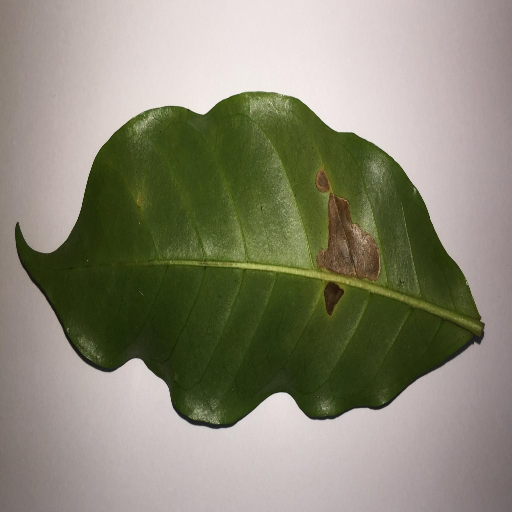

(512, 512, 1)


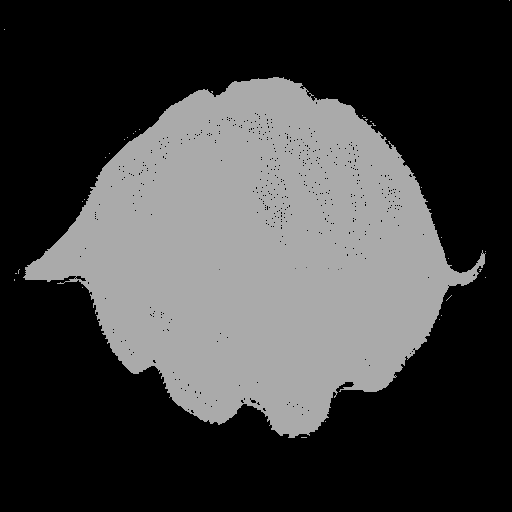

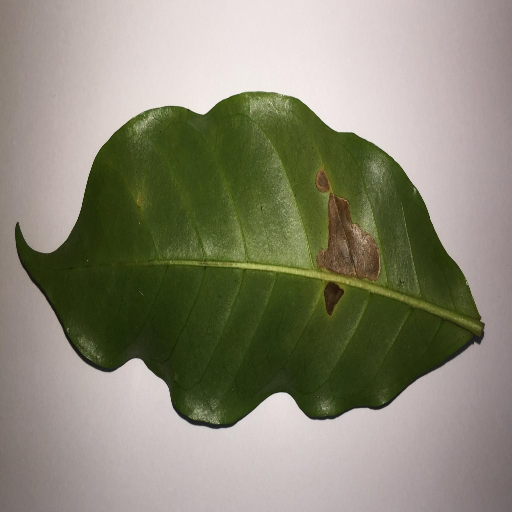

(512, 512, 1)


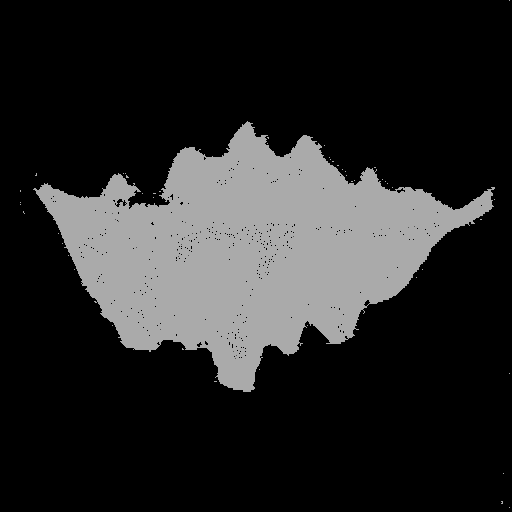

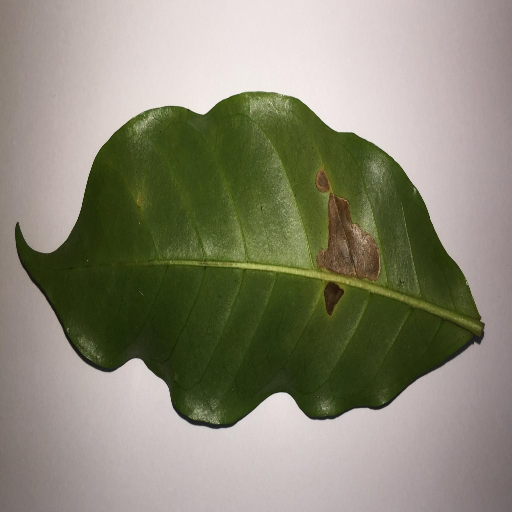

(512, 512, 1)


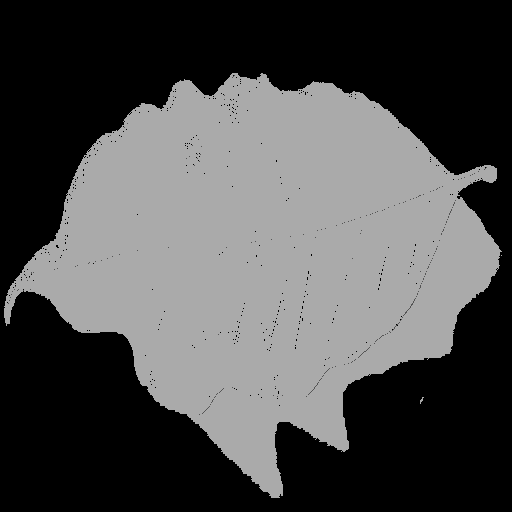

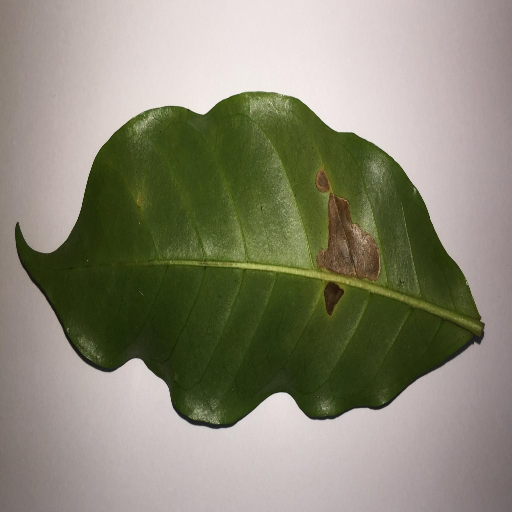

(512, 512, 1)


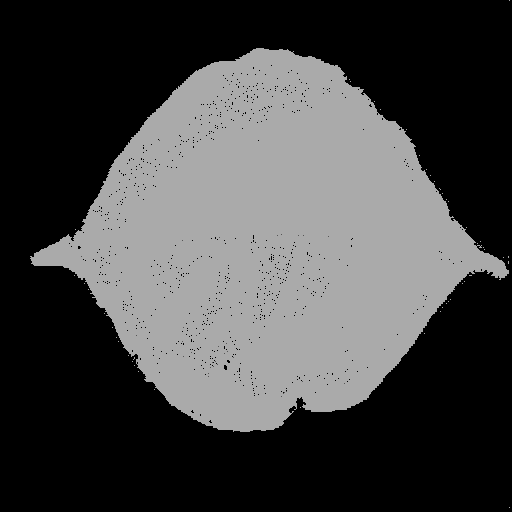

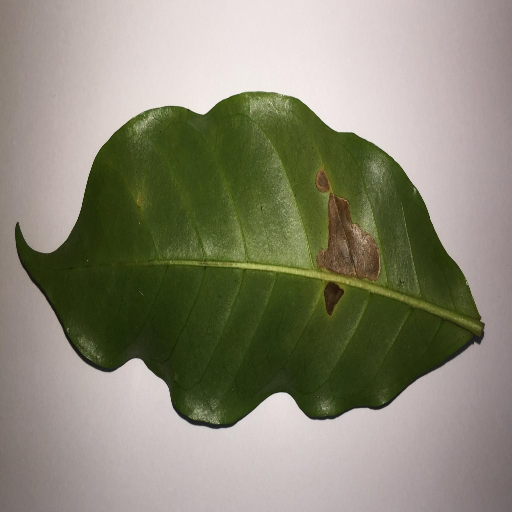

(512, 512, 1)


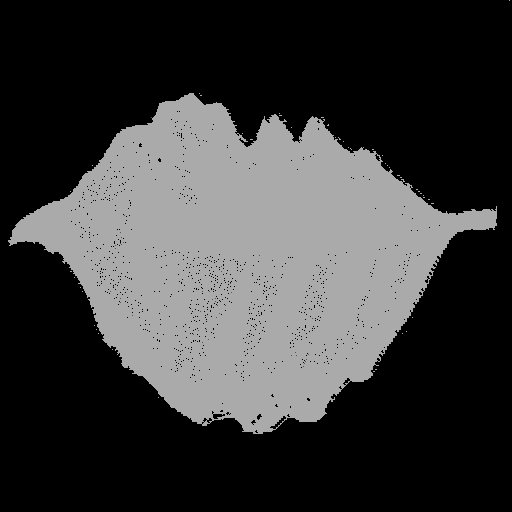

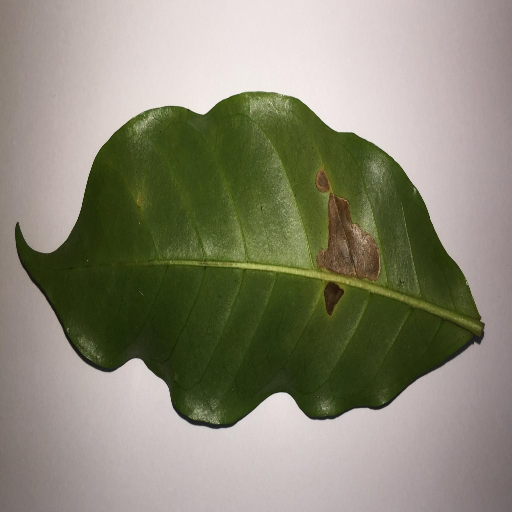

(512, 512, 1)


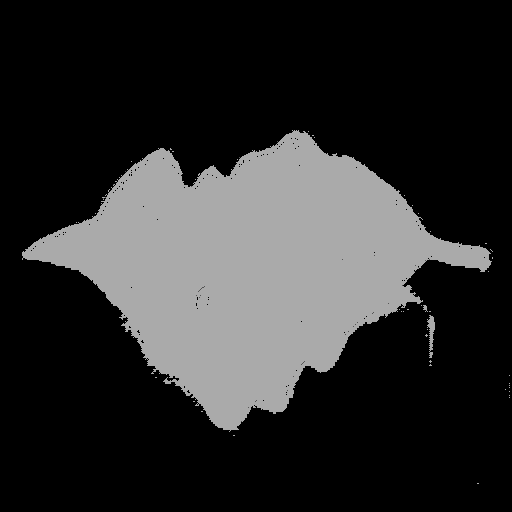

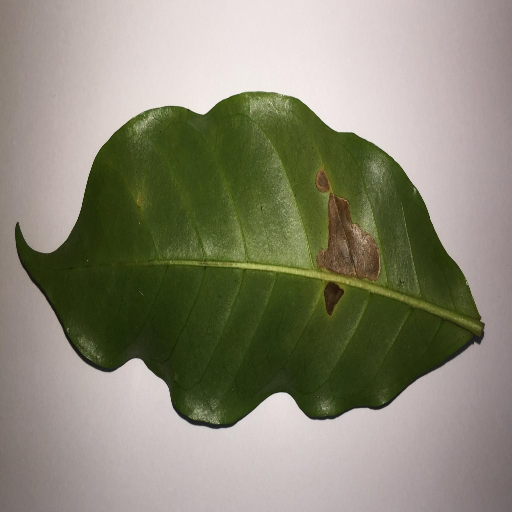

(512, 512, 1)


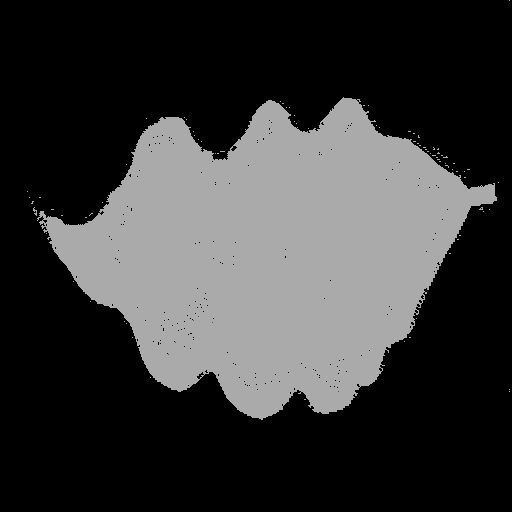

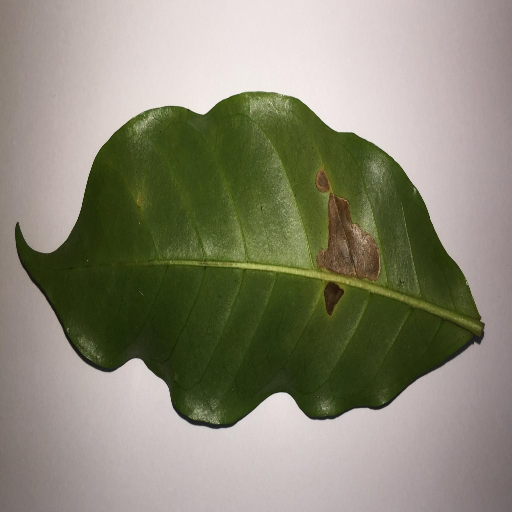

(512, 512, 1)


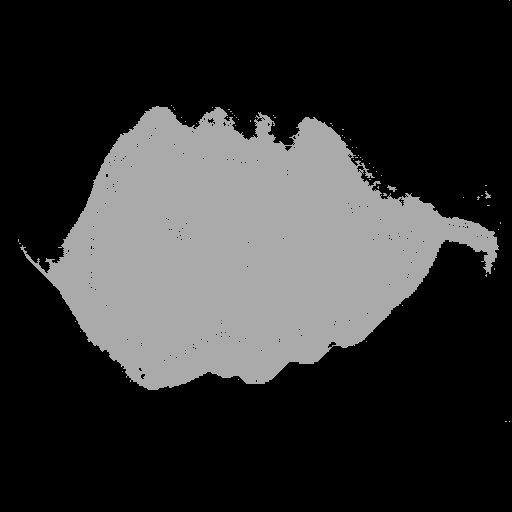

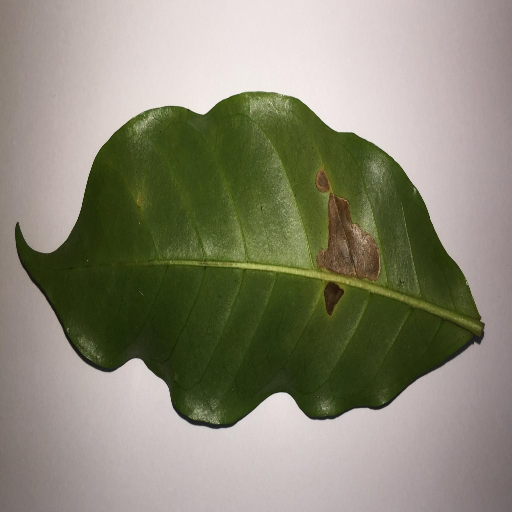

(512, 512, 1)


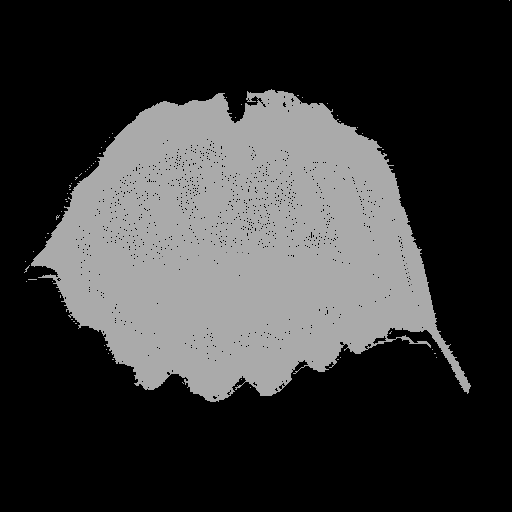

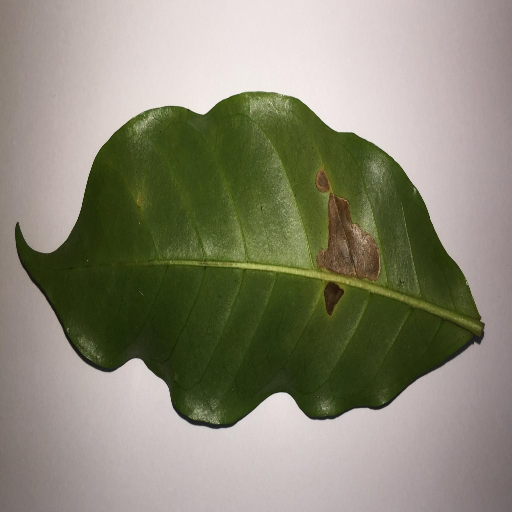

(512, 512, 1)


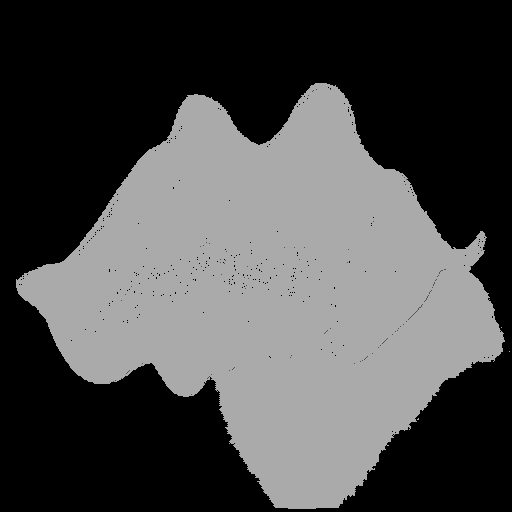

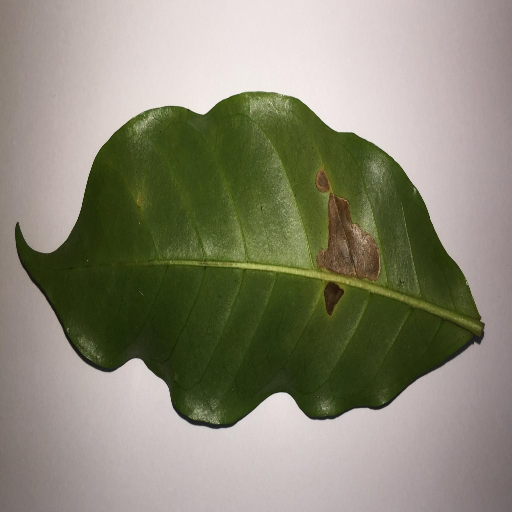

(512, 512, 1)


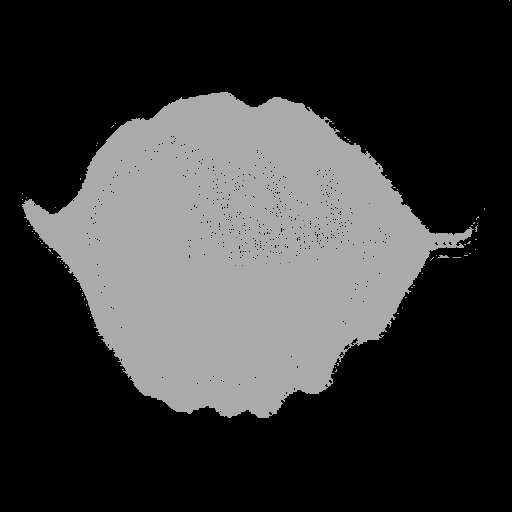

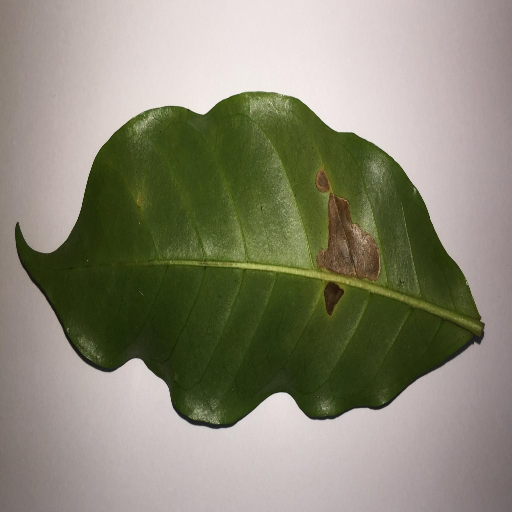

(512, 512, 1)


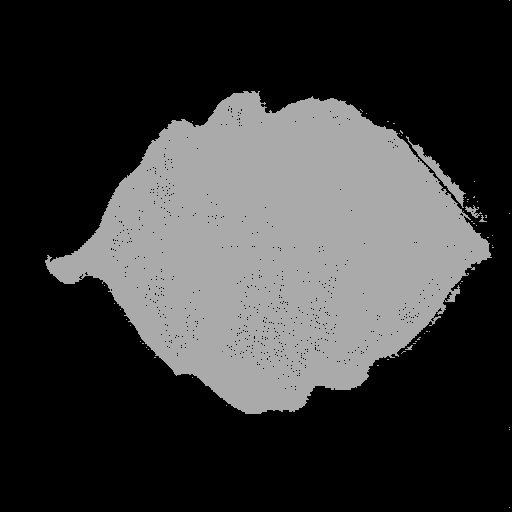

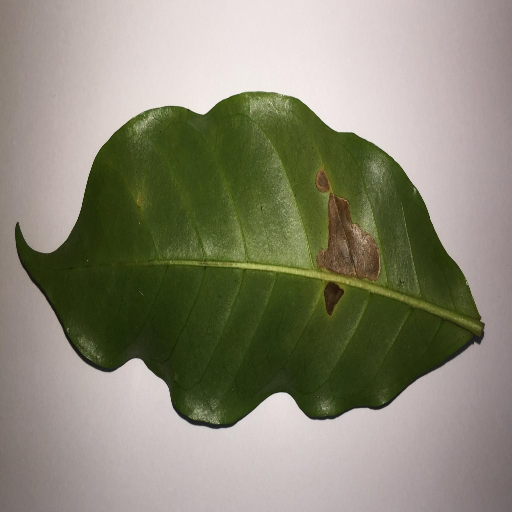

(512, 512, 1)


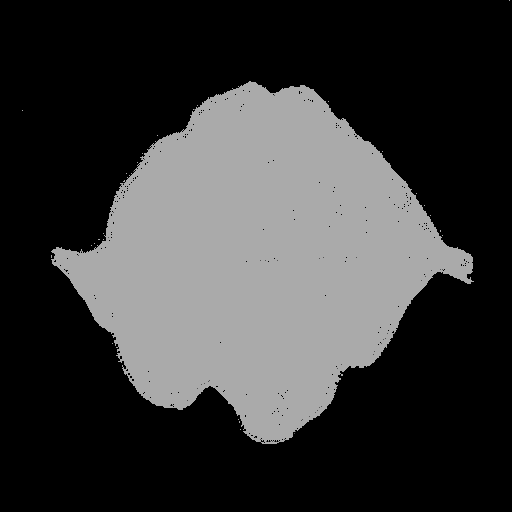

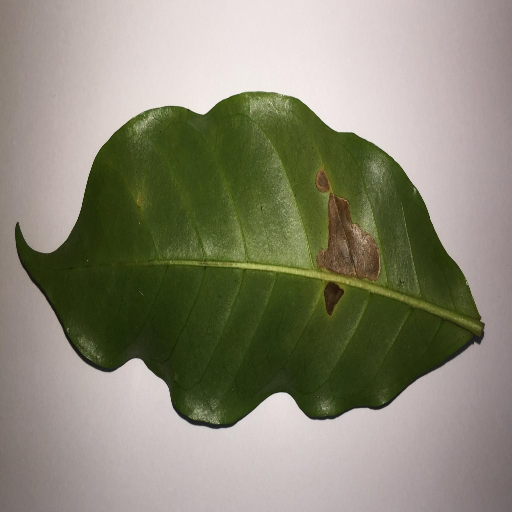

In [ ]:
for i in y:
  grayscale_mask = np.argmax(i, axis=-1)
  grayscale_mask = (grayscale_mask *255/ len(VOC_CLASSES))
  grayscale_mask = np.expand_dims(grayscale_mask, axis=-1)
  print(grayscale_mask.shape)
  cv2_imshow(grayscale_mask)
  cv2_imshow(X_train[1])

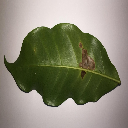

In [ ]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = Y_train[5].shape
train_masks_reshaped = Y_train[5].reshape(-1,1)
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)
# cv2_imshow(train_masks_reshaped_encoded)

/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
# cv2_imshow(train_masks_encoded_original_shape)
vv = train_masks_encoded_original_shape.reshape(-1, 3)
vv
np.unique(vv, axis = 0)
# cv2_imshow(Y_train[5])
# train_masks_encoded_original_shape.shape


array([[0, 0, 0],
       [0, 0, 1],
       [0, 1, 0],
       [1, 0, 0]])

In [ ]:
for x, y in tqdm(zip(images, masks), total=len(images)):
        """ Extract the name """
        name = x.split("/")[-1].split(".")[0]

        """ Reading the image and mask """
        image = cv2.imread(x, cv2.IMREAD_COLOR)
        mask = cv2.imread(y, cv2.IMREAD_COLOR)

        """ Resizing the image and mask """
        image = cv2.resize(image, (320, 320))
        mask = cv2.resize(mask, (320, 320))

        """ Processing the mask to one-hot mask """
        processed_mask = process_mask(mask, VOC_COLORMAP)

        """ Converting one-hot mask to single channel mask """
        grayscale_mask = np.argmax(processed_mask, axis=-1)
        grayscale_mask = (grayscale_mask / len(VOC_CLASSES)) * 255
        grayscale_mask = np.expand_dims(grayscale_mask, axis=-1)

        """ Saving the image """
        line = np.ones((320, 5, 3)) * 255
        cat_images = np.concatenate([
            image, line, mask, line,
            np.concatenate([grayscale_mask, grayscale_mask, grayscale_mask], axis=-1)
        ], axis=1)

        cv2.imwrite(f"mask/{name}.png", cat_images)

In [ ]:
path_list = sorted(glob.glob(Y_train_data_path+"/*." + 'png'))
# for i in path_list[5:10]:
img = cv2.imread(path_list[10])
# img = np.expand_dims(img, axis=-1)
print(np.unique(img, axis = 0))
# print(img.shape)
# print(img[512][1024])
# print(img[512][700])
# print(img[512][0])
# cv2_imshow(img)

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


In [ ]:
# print(Y_test[10])
print(np.unique(Y_test[3]))

[0.]


In [ ]:

""" Create a directory """
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)



if __name__ == "__main__":
    """ Create a directory """
    create_dir("mask")

    """ Dataset paths """
    dataset_path = "dataset"

    images = sorted(glob(os.path.join(dataset_path, "image", "*.jpg")))
    masks = sorted(glob(os.path.join(dataset_path, "mask", "*.png")))

    print(f"Images: {len(images)}")
    print(f"RGB Masks: {len(masks)}")

    """ VOC 2012 dataset: colormap and class names """


    """ Displaying the class name and its pixel value """
    for name, color in zip(VOC_CLASSES, VOC_COLORMAP):
        print(f"{name} - {color}")

    """ Loop over the images and masks """
    for x, y in tqdm(zip(images, masks), total=len(images)):
        """ Extract the name """
        name = x.split("/")[-1].split(".")[0]

        """ Reading the image and mask """
        image = cv2.imread(x, cv2.IMREAD_COLOR)
        mask = cv2.imread(y, cv2.IMREAD_COLOR)

        """ Resizing the image and mask """
        image = cv2.resize(image, (320, 320))
        mask = cv2.resize(mask, (320, 320))

        """ Processing the mask to one-hot mask """
        processed_mask = process_mask(mask, VOC_COLORMAP)

        """ Converting one-hot mask to single channel mask """
        grayscale_mask = np.argmax(processed_mask, axis=-1)
        grayscale_mask = (grayscale_mask / len(VOC_CLASSES)) * 255
        grayscale_mask = np.expand_dims(grayscale_mask, axis=-1)

        """ Saving the image """
        line = np.ones((320, 5, 3)) * 255
        cat_images = np.concatenate([
            image, line, mask, line,
            np.concatenate([grayscale_mask, grayscale_mask, grayscale_mask], axis=-1)
        ], axis=1)

        cv2.imwrite(f"mask/{name}.png", cat_images)

#Using Normal Segmentation Algorithms

Dice coefficient:  0.9912768734116354


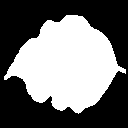

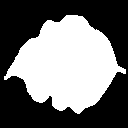

(128, 128)


In [ ]:
import numpy as np
import cv2
from sklearn.cluster import DBSCAN
import os
import glob
from google.colab.patches import cv2_imshow

IMG_HEIGHT = 128
IMG_WIDTH = 128

Y_train_data_path = "/content/lara2018/segmentation/dataset/annotations/train"
Y_test_data_path = "/content/lara2018/segmentation/dataset/annotations/test"
X_train_data_path = "/content/lara2018/segmentation/dataset/images/train"
X_test_data_path = "/content/lara2018/segmentation/dataset/images/test"

x_train_path_list = sorted(glob.glob(X_train_data_path+"/*." + 'jpg'))
x_test_path_list = sorted(glob.glob(X_test_data_path+"/*." + 'jpg'))
y_train_path_list = sorted(glob.glob(Y_train_data_path+"/*." + 'png'))
y_test_path_list = sorted(glob.glob(Y_test_data_path+"/*." + 'png'))

# path_list = sorted(glob.glob(Y_train_data_path+"/*." + 'png'))
# # for i in path_list[5:10]:
# img = cv2.imread(path_list[10])
# # img = np.expand_dims(img, axis=-1)
# print(np.unique(img, axis = 0))
# print(img.shape)
# print(img[512][1024])
# print(img[512][700])
# print(img[512][0])
# cv2_imshow(img)

# Load the image and the ground truth segmentation
img = cv2.imread(x_train_path_list[0])
gt = cv2.imread(y_train_path_list[0], cv2.IMREAD_GRAYSCALE)

img = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
gt = cv2.resize(gt, (IMG_HEIGHT, IMG_WIDTH))

# Convert the image to Lab color space
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

# Reshape the Lab image to a 2D array of pixels
pixels = lab.reshape((-1, 3))

from sklearn.cluster import DBSCAN
# Use DBSCAN clustering to cluster the pixels
deb = True
dbscan = DBSCAN(eps=7, min_samples=50)
labels = dbscan.fit_predict(pixels)

# from sklearn.cluster import AgglomerativeClustering
# # Use Hierarchical Agglomerative Clustering (HAC) to cluster the pixels
# hac = AgglomerativeClustering(n_clusters=2, linkage='ward')
# labels = hac.fit_predict(pixels)


# from sklearn.mixture import GaussianMixture
# # Use Gaussian Mixture Models (GMM) to cluster the pixels
# gmm = GaussianMixture(n_components=2)
# labels = gmm.fit_predict(pixels)


# from sklearn.cluster import SpectralClustering ---- worest
# # Use Spectral Clustering to cluster the pixels
# spectral = SpectralClustering(n_clusters=2, affinity='nearest_neighbors', assign_labels='kmeans')
# labels = spectral.fit_predict(pixels)

# Reshape the label array back into an image
mask = labels.reshape(lab.shape[:2])

# Create a binary mask of the ground truth segmentation
gt_mask = cv2.threshold(gt, 2, 255, cv2.THRESH_BINARY)[1]
# Create a binary mask of the segmentation result
# seg_mask = cv2.threshold(seg_mask, 0, 255, cv2.THRESH_BINARY_INV)[1]
seg_mask = np.abs(mask - 1) * 255
# seg_mask[seg_mask == 0] = 150

if deb:
  seg_mask[seg_mask == 255], seg_mask[seg_mask < 2] = 2, 255
  seg_mask[seg_mask == 2] = 0

# Calculate the Dice coefficient
intersection = np.logical_and(gt_mask, seg_mask)
dice_coefficient = (510.0 * intersection.sum()) / (gt_mask.sum() + seg_mask.sum())

# Display the result
print("Dice coefficient: ", dice_coefficient)

# Apply the mask to the original image

# Display the result
cv2_imshow(gt_mask)
cv2_imshow(seg_mask)
print(seg_mask.shape)

In [ ]:
intersection.sum()
# seg_mask.shape == gt_mask.shape
seg_mask = np.ndarray.flatten(seg_mask.astype("uint8"))
gt_mask = np.ndarray.flatten(gt_mask)
intersection = np.logical_and(gt_mask, seg_mask).sum()
(2.0 * intersection) / (gt_mask.sum() + seg_mask.sum())

0.003909931925292372

In [ ]:
np.unique(np.logical_and(gt_mask, seg_mask))

array([False,  True])

In [ ]:
np.unique(gt_mask)

array([  0, 255], dtype=uint8)